## Load notebook

### Python modules

In [1]:
# standard libs
import numpy as np
import pandas as pd
from scipy import sparse
import lmfit as lm
from tqdm import tqdm
import io, sys, importlib
from contextlib import redirect_stdout
import warnings
warnings.filterwarnings("ignore", message="Using UFloat objects with std_dev==0*")


# matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
plt.rcParams['font.size'], plt.rcParams['axes.labelsize'] = 14, 18

# XPCS library
sys.path.append('./XPCSlibrary/')

import ID10tools as ID10
from ID10tools import Nx, Ny, Npx
importlib.reload(ID10)
ID10.set_version('v2')

import XPCStools as XPCS
from XPCStools import E2lambda, lambda2E, theta2Q, Q2theta, decorrelation_f
importlib.reload(XPCS)
XPCS.set_beamline('ID10')

import COSMICRAYtools as COSMIC
importlib.reload(COSMIC)
COSMIC.set_beamline('ID10')

#### EXPERIMENTAL VARIABLES ####
XPCS.set_expvar(1350, 1350, 7.1)
ID10.Nfmax_dense_file = 2000
ID10.Nfmax_sparse_file = 5000
################################

###### FOLDER PATHS ######
from folder_paths import *
##########################

### Functions

In [2]:
def plotfit_byQ_4damaged_vGeO2(itime, g2, t1_fit, t2_fit, save=True):

    print("Using Global variables: model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan\n")    
    global model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan

    if t1_fit is None: t1_fit = 0
    if t2_fit is None: t2_fit = 1e100
    
    g2fit = pd.DataFrame(columns=['Q', 'dQ', 'tau', 'dtau', 'dtau%', 'beta', 'dbeta', 'dbeta%', 'c', 'dc', 'dc%', 'y0', 'dy0', 'dy%', 'redchi2'])

    # DATA PLOTS
    fig, ax = plt.subplots(figsize=(10,5))
    for i, q in enumerate(g2.keys()):
        # ax.scatter(g2[q][0], g2[q][1], s=1, c='C0')
        t_mt, g2_mt, dg2_mt = XPCS.get_g2mt_fromling2(itime, g2[q][1], g2[q][2])
        ax.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt = 'o', c='C'+str(i), label =f'Q = {q} $\\AA^{-1}$')

        tmask = (t1_fit<g2[q][0])*(g2[q][0]<t2_fit)
        x, y, dy =  g2[q][0][tmask], g2[q][1][tmask], g2[q][2][tmask]

        # FIT
        fit = model.fit(y, params, t=x, method='least_squares', weights=1/dy)
        g2fit.loc[i] = [q, dQ_section,
                        fit.params['tau'].value, fit.params['tau'].stderr, fit.params['tau'].stderr/fit.params['tau'].value*100,
                        fit.params['beta'].value, fit.params['beta'].stderr, fit.params['beta'].stderr/fit.params['beta'].value*100,
                        fit.params['c'].value, fit.params['c'].stderr, fit.params['c'].stderr/fit.params['c'].value*100,
                        fit.params['y0'].value, fit.params['y0'].stderr, fit.params['y0'].stderr/fit.params['y0'].value*100,
                        fit.redchi,]
        
        # PLOT FIT
        x = np.arange(np.min(g2[q][0]), np.max(g2[q][0]), 1e-2)
        y = fit.eval(t=x)
        ax.plot(x, y, c='C'+str(i), linestyle='--')

    if t1_fit!=0:     plt.axvline(t1_fit, color='red', linestyle='--')
    if t2_fit!=1e100: plt.axvline(t2_fit, color='red', linestyle='--')
    ax.set_xlabel('t [s]')
    ax.set_ylabel('g2')
    ax.set_xscale('log')
    
    if save: g2fit.to_csv(f"{g2fit4damaged_vGeO2_folder}g2fit-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Qs_section[0]}:{Qs_section[-1]}-dQ={dQ_section}.txt", index=False)
    display(g2fit)

    return g2fit, fig, ax

def plotfitparams_byQ_4damaged_vGeO2(g2fit):
    print("Using Global variables: sample_name, Ndataset, Nscan \n")
    global sample_name, Ndataset, Nscan

    fig, axs = plt.subplots(2, 2, figsize=(14, 8))

    # tau
    axs[0, 0].errorbar(g2fit.Q, g2fit.tau, yerr=g2fit.dtau, fmt='o')
    axs[1, 1].set_xlabel('Q [1/$\\AA$]')
    axs[0, 0].set_ylabel('tau [s]')

    # beta
    axs[0, 1].errorbar(g2fit.Q, g2fit.beta, yerr=g2fit.dbeta, fmt='o')
    axs[1, 1].set_xlabel('Q [1/$\\AA$]')
    axs[0, 1].set_ylabel('beta')

    # c
    axs[1, 0].errorbar(g2fit.Q, g2fit.c, yerr=g2fit.dc, fmt='o')
    axs[1, 1].set_xlabel('Q [1/$\\AA$]')
    axs[1, 0].set_ylabel('c')

    # y0
    axs[1, 1].errorbar(g2fit.Q, g2fit.y0, yerr=g2fit.dy0, fmt='o')
    axs[1, 1].set_xlabel('Q [1/$\\AA$]')
    axs[1, 1].set_ylabel('y0')

    return fig, axs



def plotfit_byQ_bydose(itime, Lbin, g2, t1_fit, t2_fit):
    print("Using Global variables: Nbunch, model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan \n")  
    global Nbunch, model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan
    
    if t1_fit is None: t1_fit = 0
    if t2_fit is None: t2_fit = 1e100
    if Lbin is None: Lbin=1

    for q in g2.keys():
        print(f"###### Q = {q} ######")
        fig, ax = plt.subplots(figsize=(10,5))
        g2fit = pd.DataFrame(columns=['Q', 'dQ', 'tau', 'dtau', 'dtau%', 'beta', 'dbeta', 'dbeta%', 'c', 'dc', 'dc%', 'y0', 'dy0', 'dy%', 'redchi2'])
        g2fit.index.name = 'tw'
        for i,k in enumerate(g2[q].keys()):
            t_mt, g2_mt, dg2_mt = XPCS.get_g2mt_fromling2(itime*Lbin, g2[q][k][1], g2[q][k][2])
            ax.scatter(g2[q][k][0], g2[q][k][1], s=1, c='C'+str(i))
            ax.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt = 'o', c='C'+str(i), label =f'd = {k}s')
            
            tmask = (t1_fit<g2[q][k][0])*(g2[q][k][0]<t2_fit)
            x, y, dy =  g2[q][k][0][tmask], g2[q][k][1][tmask], g2[q][k][2][tmask]
            
            fit = model.fit(y, params, t=x, method='least_squares', weights=1/dy)
            g2fit.loc[k] = [q, dQ_section,
                            fit.params['tau'].value, fit.params['tau'].stderr, fit.params['tau'].stderr/fit.params['tau'].value*100,
                            fit.params['beta'].value, fit.params['beta'].stderr, fit.params['beta'].stderr/fit.params['beta'].value*100,
                            fit.params['c'].value, fit.params['c'].stderr, fit.params['c'].stderr/fit.params['c'].value*100,
                            fit.params['y0'].value, fit.params['y0'].stderr, fit.params['y0'].stderr/fit.params['y0'].value*100,
                            fit.redchi,]

            x = np.arange(np.min(g2[q][k][0]), np.max(g2[q][k][0]), 1e-2)
            y = fit.eval(t=x)
            ax.plot(x, y,)
        display(g2fit)
        if t1_fit!=0:     plt.axvline(t1_fit, color='red', linestyle='--')
        if t2_fit!=1e100: plt.axvline(t2_fit, color='red', linestyle='--')

        ax.set_xlabel('t [s]')
        ax.set_ylabel('g2')
        ax.set_xscale('log')
        ax.set_ylim(1, 1.04)
        ax.legend()
        fig.tight_layout()
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        fig.tight_layout()
        fig.show()
  
        fig, axs = plt.subplots(2, 2, figsize=(14, 8))
        fig.suptitle(f'Q = {q} $\\AA^{{-1}}$')
        # tau
        axs[0, 0].errorbar(g2fit.index, g2fit.tau, yerr=g2fit.dtau, fmt='o')
        axs[0, 0].set_xlabel('t [s]')
        axs[0, 0].set_ylabel('tau [s]')
        axs[0, 0].set_xlim(left=0)

        # beta
        axs[0, 1].errorbar(g2fit.index, g2fit.beta, yerr=g2fit.dbeta, fmt='o')
        axs[0, 1].set_xlabel('t [s]')
        axs[0, 1].set_ylabel('beta')
        axs[0, 1].set_xlim(left=0)

        # c
        axs[1, 0].errorbar(g2fit.index, g2fit.c, yerr=g2fit.dc, fmt='o')
        axs[1, 0].set_xlabel('t [s]')
        axs[1, 0].set_ylabel('c')
        axs[1, 0].set_xlim(left=0)

        # y0
        axs[1, 1].errorbar(g2fit.index, g2fit.y0, yerr=g2fit.dy0, fmt='o')
        axs[1, 1].set_xlabel('t [s]')
        axs[1, 1].set_ylabel('y0')

        fig.tight_layout(); fig.show()

def plotfit_byQ_4damaged_vGeO2(itime, g2, t1_fit, t2_fit, mt=False, save=True):

    print("Using Global variables: model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan\n")    
    global model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan

    if t1_fit is None: t1_fit = 0
    if t2_fit is None: t2_fit = 1e100
    
    g2fit = pd.DataFrame(columns=['Q', 'dQ', 'tau', 'dtau', 'dtau%', 'beta', 'dbeta', 'dbeta%', 'c', 'dc', 'dc%', 'y0', 'dy0', 'dy%', 'redchi2'])

    # DATA PLOTS
    fig, ax = plt.subplots(figsize=(10,5))
    for i, q in enumerate(g2.keys()):
        if not mt:
            # ax.scatter(g2[q][0], g2[q][1], s=1, c='C0')
            t_mt, g2_mt, dg2_mt = XPCS.get_g2mt_fromling2(itime, g2[q][1], g2[q][2])
            ax.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt = 'o', c='C'+str(i), label =f'Q = {q} $\\AA^{-1}$')
        else:
            ax.errorbar(g2[q][0], g2[q][1], yerr=g2[q][2], fmt = 'o', c='C'+str(i), label =f'Q = {q} $\\AA^{-1}$')

        if not mt: tmask = (t1_fit<g2[q][0])*(g2[q][0]<t2_fit)
        else:      tmask = (t1_fit<g2[q][0])*(g2[q][0]<t2_fit)*(g2[q][1]>0)
        
        if not mt: x, y, dy =  g2[q][0][tmask], g2[q][1][tmask], g2[q][2][tmask]
        else:      x, y, dy =  g2[q][0][tmask], g2[q][1][tmask], g2[q][2][tmask]*g2[q][1][tmask]

        # FIT
        fit = model.fit(y, params, t=x, method='least_squares', weights=1/dy)
        g2fit.loc[i] = [q, dQ_section,
                        fit.params['tau'].value, fit.params['tau'].stderr, fit.params['tau'].stderr/fit.params['tau'].value*100,
                        fit.params['beta'].value, fit.params['beta'].stderr, fit.params['beta'].stderr/fit.params['beta'].value*100,
                        fit.params['c'].value, fit.params['c'].stderr, fit.params['c'].stderr/fit.params['c'].value*100,
                        fit.params['y0'].value, fit.params['y0'].stderr, fit.params['y0'].stderr/fit.params['y0'].value*100,
                        fit.redchi,]
        
        # PLOT FIT
        x = np.arange(np.min(g2[q][0]), np.max(g2[q][0]), 1e-2)
        y = fit.eval(t=x)
        ax.plot(x, y, c='C'+str(i), linestyle='--')

    if t1_fit!=0:     plt.axvline(t1_fit, color='red', linestyle='--')
    if t2_fit!=1e100: plt.axvline(t2_fit, color='red', linestyle='--')
    ax.set_xlabel('t [s]')
    ax.set_ylabel('g2')
    ax.set_xscale('log')
    
    if save:
        if mt: name='g2mtfit'
        else: name='g2fit'
        g2fit.to_csv(f"{g2fit4damaged_vGeO2_folder}{name}-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Qs_section[0]}:{Qs_section[-1]}-dQ={dQ_section}.txt", index=False)
    display(g2fit)

    return g2fit, fig, ax

### Load masks

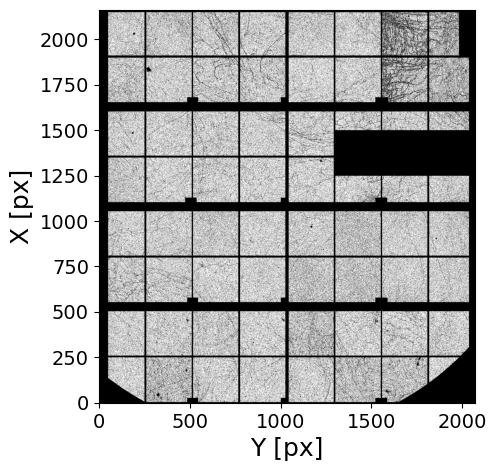

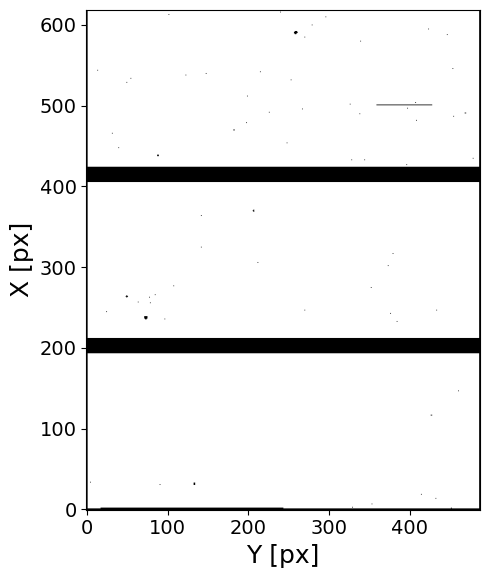

In [3]:
### e4m MASKS
e4m_htmask = np.load(MASKS_folder+'e4m_htmask-GeO2_3_240C_0001_0004'+'.npy')
e4m_mask = np.load(MASKS_folder+'e4m_mask'+'.npy')

plt.figure(figsize=(5, 5))
plt.imshow((e4m_mask*e4m_htmask).reshape(Nx,Ny), cmap='gray', origin='lower')
plt.xlabel('Y [px]')
plt.ylabel('X [px]')
plt.tight_layout(); plt.show()

### pilatus MASKS
pilatus_mask = np.load(MASKS_folder+'pilatus300k_mask_20240201'+'.npy').astype(bool)

plt.figure(figsize=(6, 6))
plt.imshow(~pilatus_mask, cmap='gray', origin='lower')
plt.xlabel('Y [px]')
plt.ylabel('X [px]')
plt.tight_layout(); plt.show()

##  XPCS scan: delcoup=1.75 T=30, 30min @ 1ms (150000 frames (stoped)) (GeO2_6q_delcoup1.75, dataset 1, scan 1)$

In [4]:
#######################################
sample_name = 'GeO2_6q_delcoup_1.75'
Ndataset = 1
Nscan = 1
Nfi, Nff = None, None
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 3599664
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 30.11 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/29 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/29 lo

### Qmask

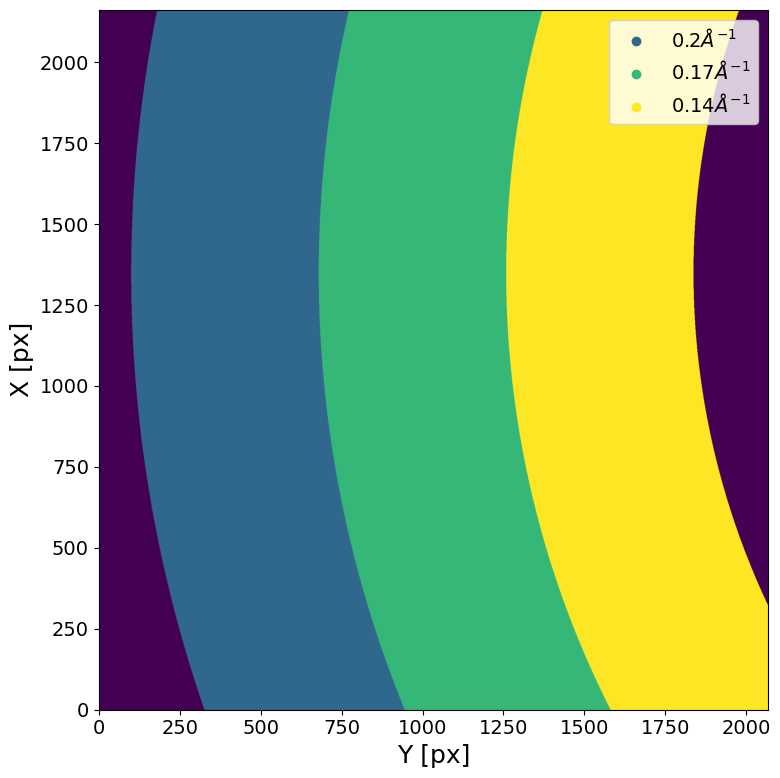

In [5]:
###################
Qs_section = [.2, .17, .14]
dQ_section = .015
###################

Qmask = XPCS.gen_Qmask(Ei, theta, Qs_section, dQ_section, Qmap_plot=False)

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  100910 pixels (of 4471016 => 2.26 %)
################################################################################



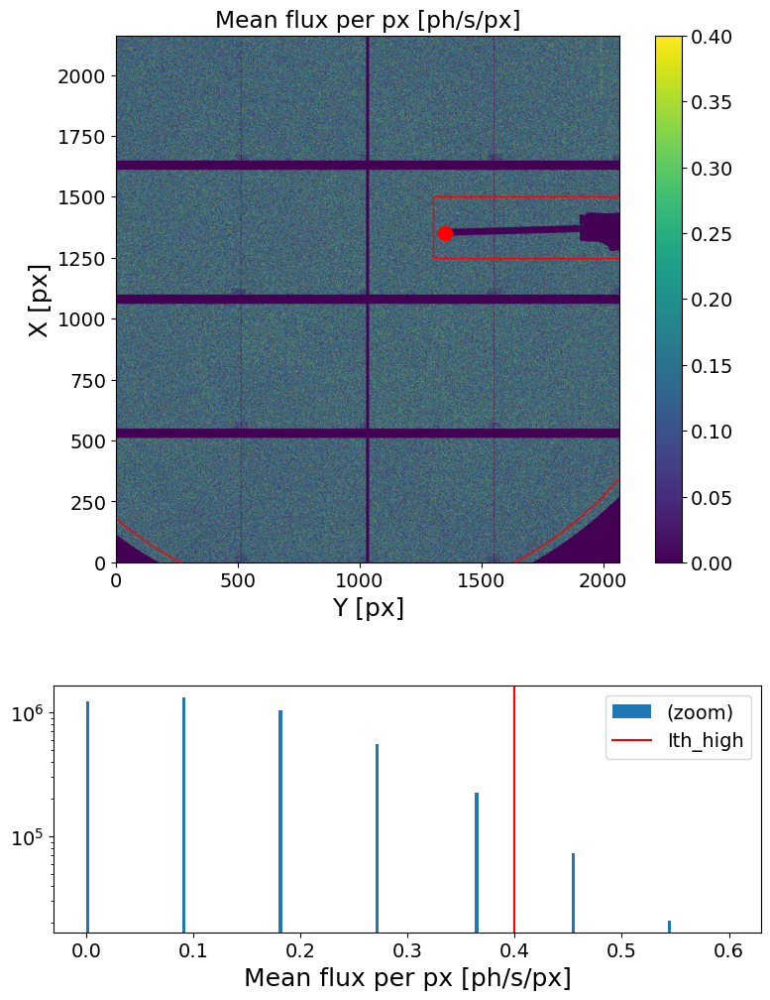

#################################################
Masked area =  93.74594052000708 %
#################################################



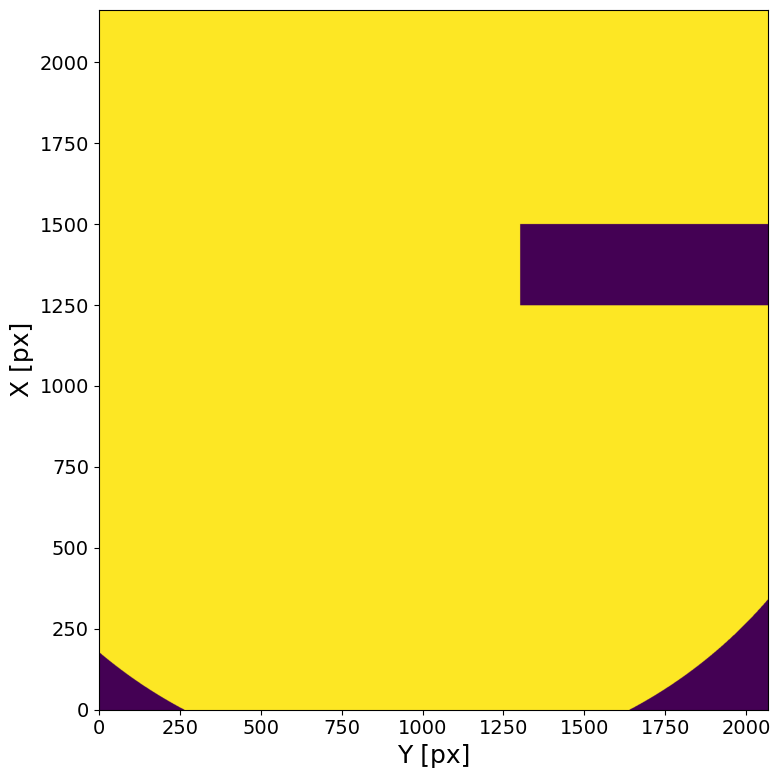

In [6]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.4, Nff=10000, mask_geom=geom,)
bs_mask = XPCS.gen_mask(mask_geom=geom)

### Intensity analysis

In [7]:
####################
Lbin = 1000
Nstep = 1000
Nfi = 15
####################

It = {}
for q in Qmask.keys():
    mask= e4m_mask * e4m_htmask * bs_mask * Qmask[q]
    It[q] = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Nfi=Nfi, Lbin=Lbin, Nstep=Nstep))
    np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", It[q])

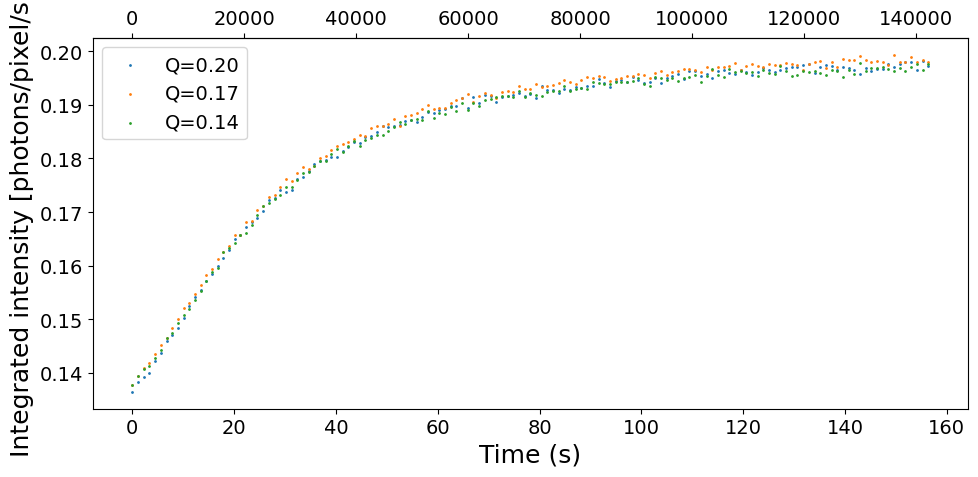

In [8]:
plt.figure(figsize=(10,5))
for q in Qmask.keys():
    plt.scatter(It[q][0], It[q][1], label='Q={:.2f}'.format(q), s=1)
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.legend()
plt.tight_layout(); plt.show()

### Linear Correlation by Dose

In [9]:
###################
Nfi = 20
Nff = None
Lbin = 50
###################
if Lbin is None: Lbin=1

G2t = {}
for q in tqdm(Qs_section, desc='Calculating G2'):
    with redirect_stdout(io.StringIO()):
        mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
        G2t[q] = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin)

Calculating G2: 100%|██████████| 3/3 [00:22<00:00,  7.55s/it]


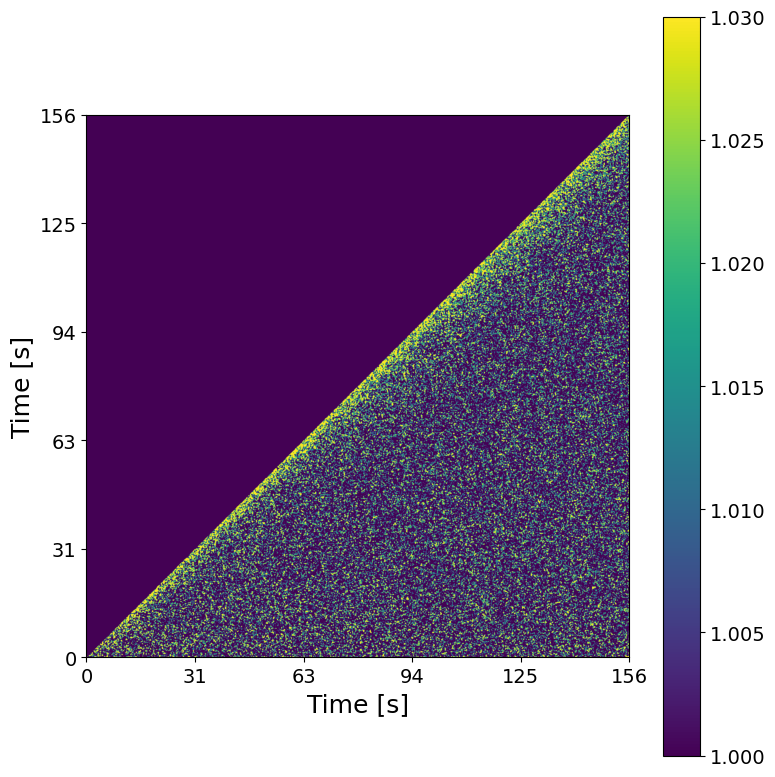

In [10]:
############################
q = .2
t1, t2 = None, None
vmin, vmax = 1.0, 1.03
############################
XPCS.plot_G2t(G2t[q], vmin, vmax, itime=itime*Lbin, t1=t1, t2=t2, sigma_filter=2)

In [11]:
################
Nbunch = 5
################

NfXbunch = int(G2t[q].shape[0]/Nbunch)
g2 = {}
for q in tqdm(Qs_section):
    g2[q] = {}
    for n in range(Nbunch):
        t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
        with redirect_stdout(io.StringIO()):
            g2[q][t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[q][NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

100%|██████████| 3/3 [00:00<00:00, 110.81it/s]


Using Global variables: Nbunch, model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan 

###### Q = 0.2 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
15.6,0.2,0.015,2.859783,0.326526,11.417856,1.134600,0.176333,15.541386,0.028987,0.002516,8.678294,1.0023,0.0,0.0,1.093387
46.9,0.2,0.015,3.520894,0.265315,7.535448,1.083540,0.105653,9.750751,0.033349,0.001852,5.552994,1.0023,0.0,0.0,0.931524
78.1,0.2,0.015,4.996370,0.399371,7.993230,0.941312,0.084316,8.957321,0.031560,0.001692,5.361046,1.0023,0.0,0.0,0.943804
109.3,0.2,0.015,5.912736,0.480528,8.127007,0.949790,0.090709,9.550451,0.029685,0.001633,5.501569,1.0023,0.0,0.0,1.085508
140.6,0.2,0.015,6.005053,0.471219,7.847046,0.921280,0.081747,8.873179,0.029768,0.001550,5.207856,1.0023,0.0,0.0,0.928633


###### Q = 0.17 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
15.6,0.17,0.015,2.871247,0.370879,12.917011,1.370348,0.311552,22.735241,0.028111,0.003106,11.049553,1.0023,0.0,0.0,2.223277
46.9,0.17,0.015,4.686015,0.285169,6.085542,1.257781,0.123841,9.845953,0.030773,0.001509,4.904279,1.0023,0.0,0.0,1.041452
78.1,0.17,0.015,5.974632,0.401882,6.726466,1.142008,0.113077,9.901623,0.029257,0.001492,5.099934,1.0023,0.0,0.0,1.214665
109.3,0.17,0.015,7.865142,2.046402,26.018625,1.465451,0.784202,53.512664,0.027408,0.006122,22.337829,1.0023,0.0,0.0,40.462700
140.6,0.17,0.015,6.827821,0.600234,8.791006,0.824720,0.075464,9.150302,0.032675,0.001783,5.455604,1.0023,0.0,0.0,1.101207


###### Q = 0.14 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
15.6,0.14,0.015,3.144299,0.368390,11.716126,1.071937,0.158971,14.830252,0.031656,0.002698,8.521825,1.0023,0.0,0.0,1.010812
46.9,0.14,0.015,4.759536,0.433663,9.111451,0.948039,0.096974,10.228876,0.034191,0.002106,6.159531,1.0023,0.0,0.0,1.013433
78.1,0.14,0.015,7.156864,0.512934,7.167016,1.033763,0.100380,9.710154,0.031243,0.001596,5.108039,1.0023,0.0,0.0,1.079992
109.3,0.14,0.015,6.554782,0.554839,8.464643,0.852882,0.076791,9.003657,0.035022,0.001877,5.359883,1.0023,0.0,0.0,0.984439
140.6,0.14,0.015,7.356223,0.620241,8.431520,0.846358,0.078553,9.281360,0.033224,0.001773,5.335578,1.0023,0.0,0.0,0.953704


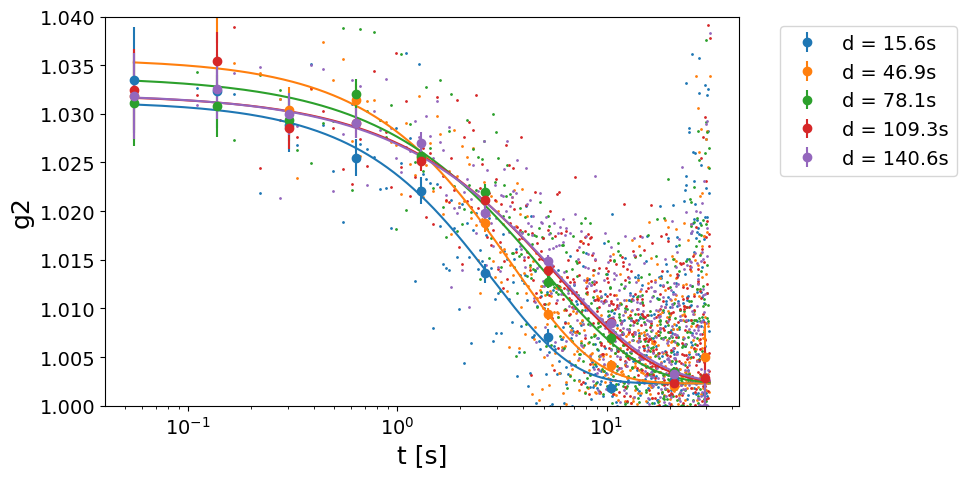

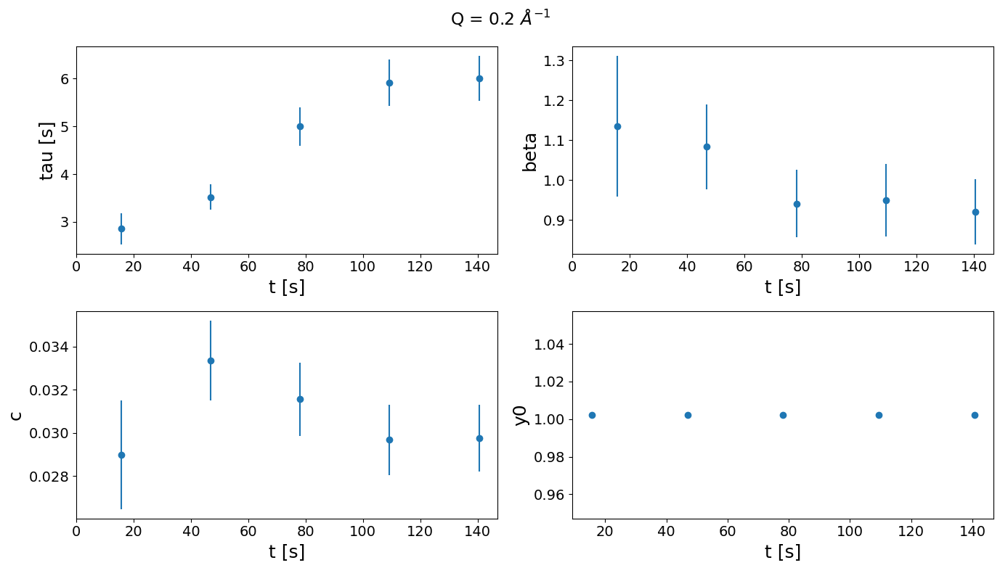

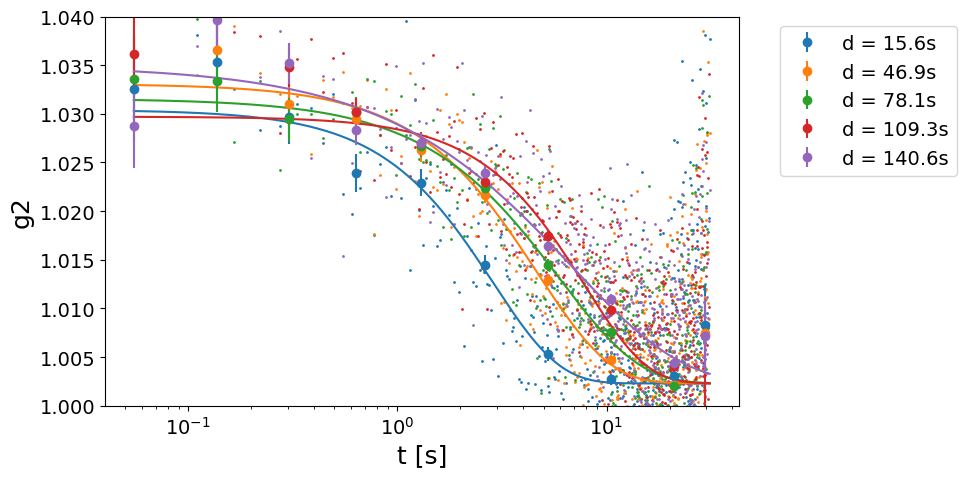

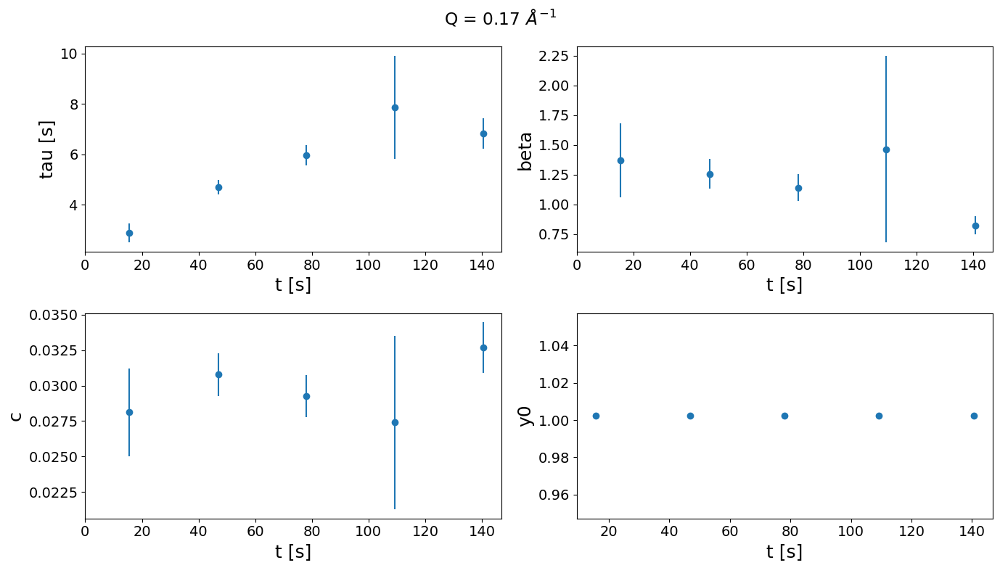

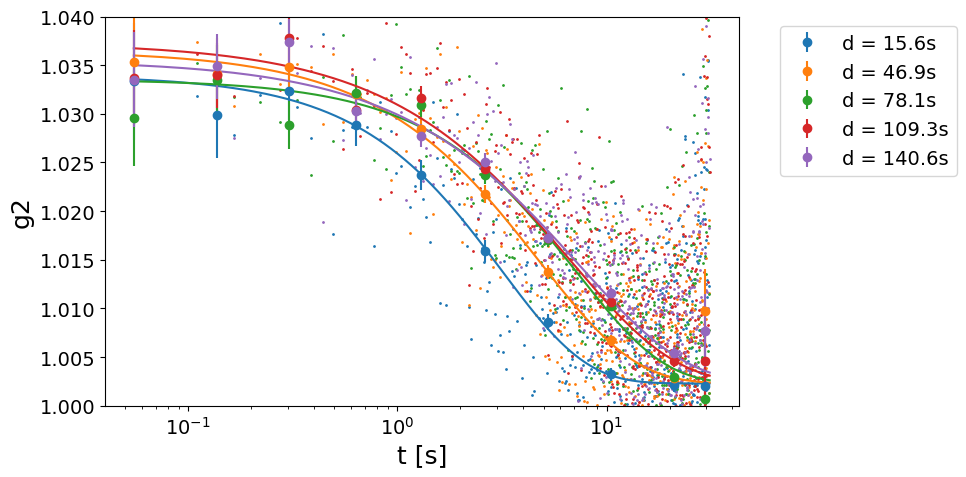

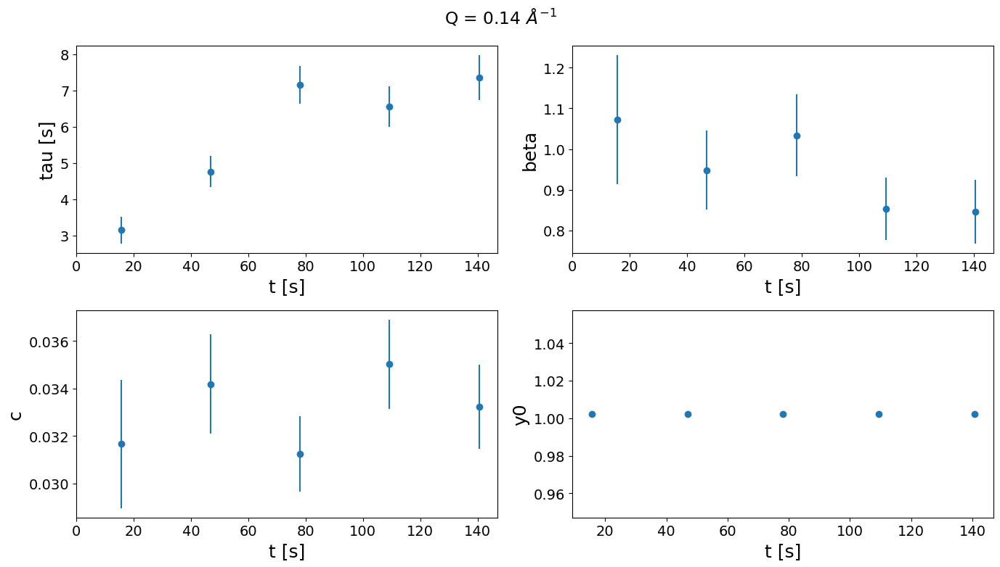

In [12]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
params.add('y0', value=1.0023, vary=False)
##############################################

plotfit_byQ_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [13]:
Nfi = 90000

g2 = {}
for q in tqdm(Qmask.keys()):
    with redirect_stdout(io.StringIO()):
        mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
        G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=None, Lbin=None)
        g2[q] = np.vstack(XPCS.get_g2(itime, G2t))
        np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", g2[q])

100%|██████████| 3/3 [00:21<00:00,  7.09s/it]


Using Global variables: model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan



,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.20,0.015,5.982556,0.299975,5.014159,1.042387,0.064440,6.181925,0.028188,0.001004,3.563363,1.0023,0.0,0.0,1.003221
1,0.17,0.015,6.507864,0.333898,5.130691,0.932810,0.051033,5.470897,0.031319,0.001062,3.389575,1.0023,0.0,0.0,1.015132
2,0.14,0.015,6.934158,0.361620,5.215056,0.956952,0.055422,5.791463,0.032528,0.001140,3.504604,1.0023,0.0,0.0,1.007378


Using Global variables: sample_name, Ndataset, Nscan 



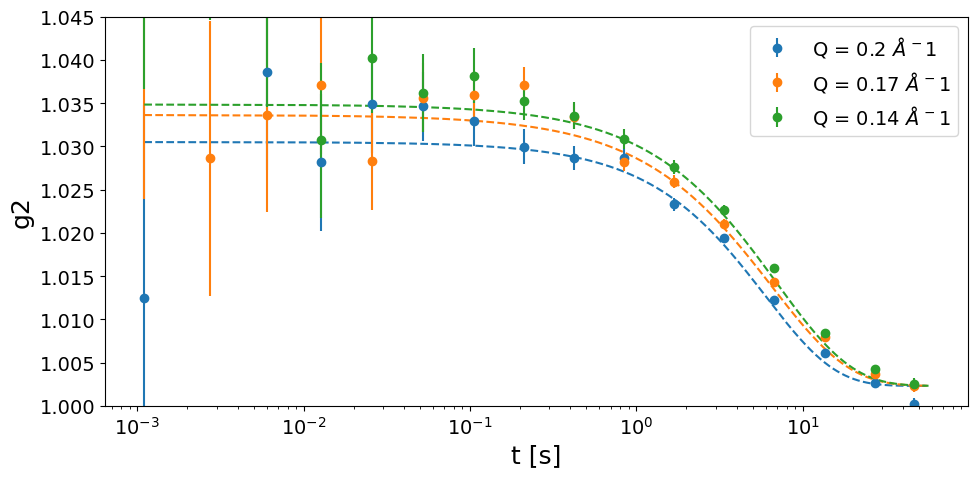

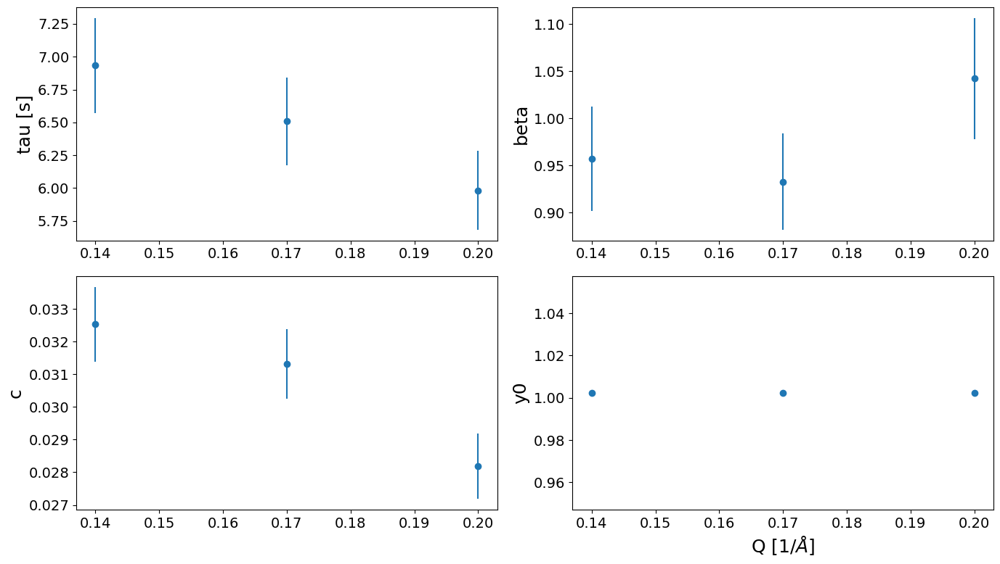

In [14]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.03)
params.add('y0', value=1.0023, vary=False)
##############################################

g2fit, fig, ax = plotfit_byQ_4damaged_vGeO2(itime, g2, t1_fit, t2_fit, save=True)
ax.set_ylim(1, 1.045)
ax.legend()
fig.tight_layout(); fig.show()

fig, axs = plotfitparams_byQ_4damaged_vGeO2(g2fit)
fig.tight_layout(); fig.show()

### Multitau correlation of damaged-vGeO2

In [15]:
XPCS.print_Nf_choices(e4m_data.shape[0]-70000)

       Nf = 72112    =>    log2(Nf) = 16.14
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**16                 15              9.1           6576
1   17*2**12                 11              3.0           2480
2   35*2**11                 10              1.0            432
----------------------------------------------------


In [16]:
##### INPUTS #####
Nfi = 70000
Nff = Nfi +  2**16
sparse_depth = 12
dense_depth = 15
##################

G2tmt, g2mt = {}, {}
for q in tqdm(Qmask.keys(), desc=f'Calculating G2tmt @ q={q}'):
    mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
    G2tmt[q] = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)
    g2mt[q] = np.vstack(XPCS.get_g2mt(itime, G2tmt[q]))
    np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", g2mt[q])

Calculating G2tmt @ q=0.14:   0%|          | 0/3 [00:00<?, ?it/s]

Loading frames ...
Done! (elapsed time = 0.68 s)
Masking data ...
Done! (elapsed time = 1.14 s)
	 | 65536 frames X 851279 pixels
	 | sparsity = 2.15e-04
	 | memory usage (sparse.csr_array @ float32) = 0.134 GB
Computing sparse multitau G2t...


100%|██████████| 16/16 [00:05<00:00,  2.97it/s]


Done! (elapsed time = 5.39 s)
Computing dense multitau G2t...


Calculating G2tmt @ q=0.14:  33%|███▎      | 1/3 [00:07<00:14,  7.25s/it]

Done! (elapsed time = 0.03 s)
Loading frames ...
Done! (elapsed time = 0.67 s)
Masking data ...
Done! (elapsed time = 1.13 s)
	 | 65536 frames X 843706 pixels
	 | sparsity = 2.16e-04
	 | memory usage (sparse.csr_array @ float32) = 0.134 GB
Computing sparse multitau G2t...


100%|██████████| 16/16 [00:05<00:00,  2.83it/s]


Done! (elapsed time = 5.66 s)
Computing dense multitau G2t...


Calculating G2tmt @ q=0.14:  67%|██████▋   | 2/3 [00:14<00:07,  7.40s/it]

Done! (elapsed time = 0.03 s)
Loading frames ...
Done! (elapsed time = 0.67 s)
Masking data ...
Done! (elapsed time = 1.05 s)
	 | 65536 frames X 669263 pixels
	 | sparsity = 2.15e-04
	 | memory usage (sparse.csr_array @ float32) = 0.106 GB
Computing sparse multitau G2t...


100%|██████████| 16/16 [00:04<00:00,  3.41it/s]


Done! (elapsed time = 4.7 s)
Computing dense multitau G2t...


Calculating G2tmt @ q=0.14: 100%|██████████| 3/3 [00:21<00:00,  7.07s/it]

Done! (elapsed time = 0.02 s)


<>:13: SyntaxWarning: invalid escape sequence '\s'
<>:13: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_11184/2507261023.py:13: SyntaxWarning: invalid escape sequence '\s'
  plt.ylabel('$\sigma_{g2}$')


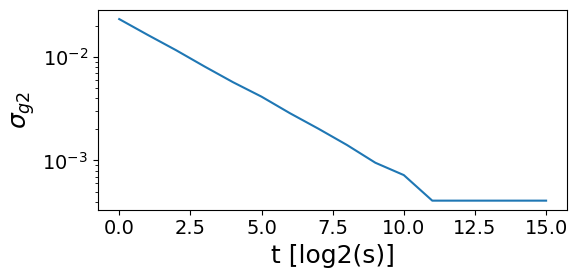

In [17]:
# Cure the std divergence
for q in g2mt.keys():
    g2mt[q][2][-1] = g2mt[q][2][-5]
    g2mt[q][2][-2] = g2mt[q][2][-5]
    g2mt[q][2][-3] = g2mt[q][2][-5]
    g2mt[q][2][-4] = g2mt[q][2][-5]

# plot
plt.figure(figsize=(6, 3))
plt.plot(g2mt[q][2])
plt.yscale('log')
plt.xlabel('t [log2(s)]')
plt.ylabel('$\sigma_{g2}$')
plt.tight_layout(); plt.show()

#### Check of the dose-independence

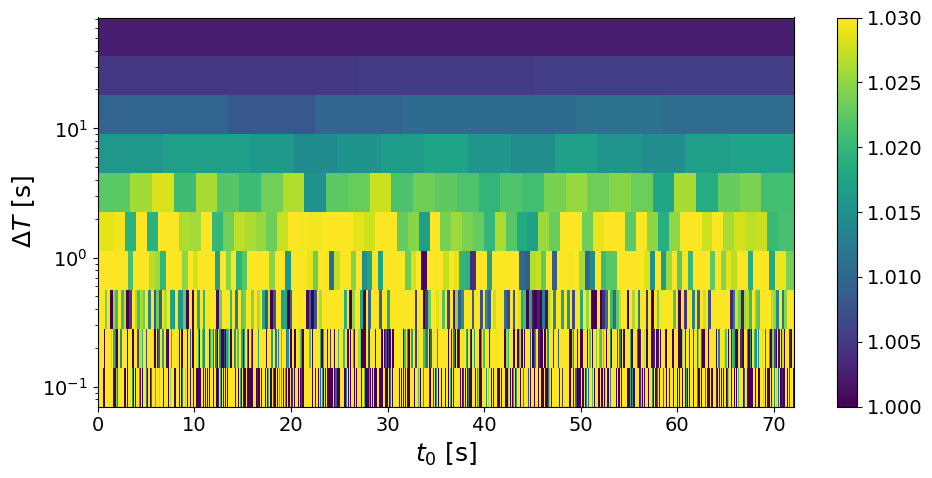

In [18]:
############################
q = .2
vmin, vmax = 1.0, 1.03
lower_mt = 6
filter_layer = 6
############################

XPCS.plot_G2tmt(G2tmt[q], itime, vmin, vmax, yscale='log', lower_mt=lower_mt, filter_layer=filter_layer)

#### Fit

Using Global variables: model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan



,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.20,0.015,5.713119,0.329750,5.771801,0.772613,0.053925,6.979554,0.033063,0.001337,4.043134,1.002059,0.000549,0.054826,0.597042
1,0.17,0.015,7.092077,0.309916,4.369884,0.710502,0.035614,5.012576,0.035405,0.001124,3.174528,1.001248,0.000538,0.053756,0.311181
2,0.14,0.015,7.163897,0.365325,5.099535,0.778525,0.049503,6.358555,0.034363,0.001350,3.929654,1.002914,0.000583,0.058113,0.577830


Using Global variables: sample_name, Ndataset, Nscan 



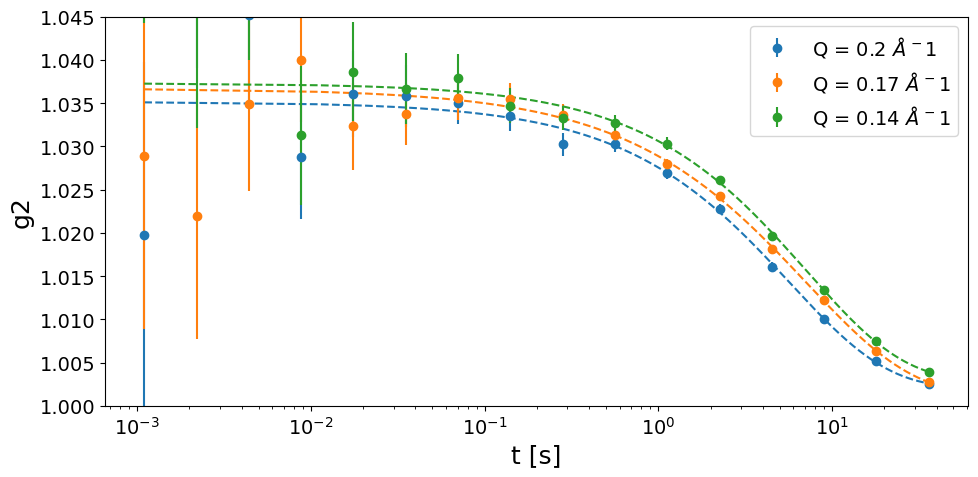

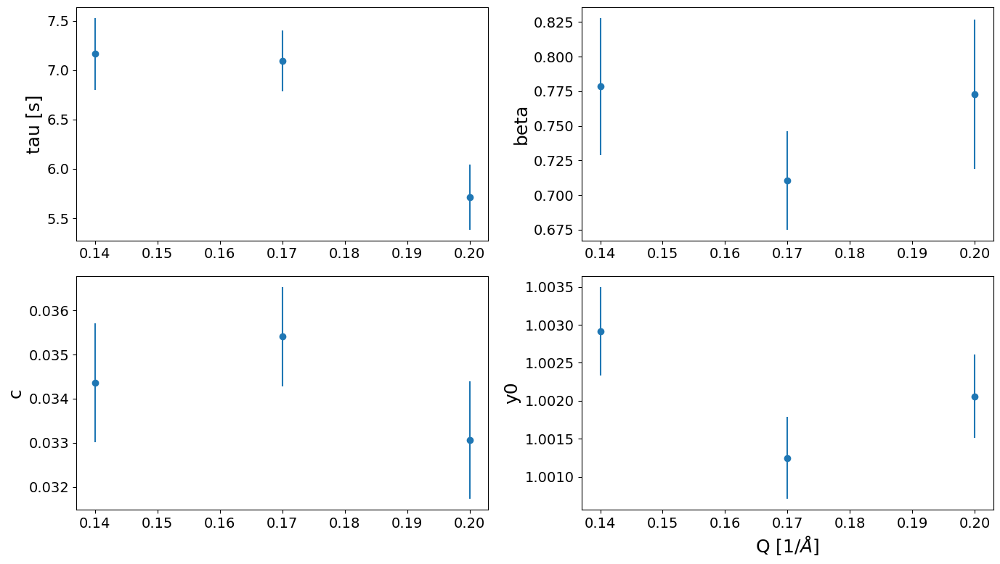

In [19]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.03)
#params.add('y0', value=1.0023, vary=False)
##############################################

g2fit, fig, ax = plotfit_byQ_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True, mt=True)
ax.set_ylim(1, 1.045)
ax.legend()
fig.tight_layout(); fig.show()

fig, axs = plotfitparams_byQ_4damaged_vGeO2(g2fit)
fig.tight_layout(); fig.show()

## XPCS scan: delcoup=1.75, T=30, 75min @ 20ms ON damaged point (GeO2_6, dataset 1, scan 12)
Start of the Temperature ramp!

In [20]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan =12
Nfi, Nff = 1, None
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=60)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 220000
Ei = 9.699998837562536
itime = 0.0201
theta = 1.7500000000000004
Q = 0.15
T = 73.70 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00024.h5 (25/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00023.h5 (24/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00031.h5 (32/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00029.h5 (30/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00032.h5 (33/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00033.h5 (34/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00037.h5 (38/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/4

### Qmask

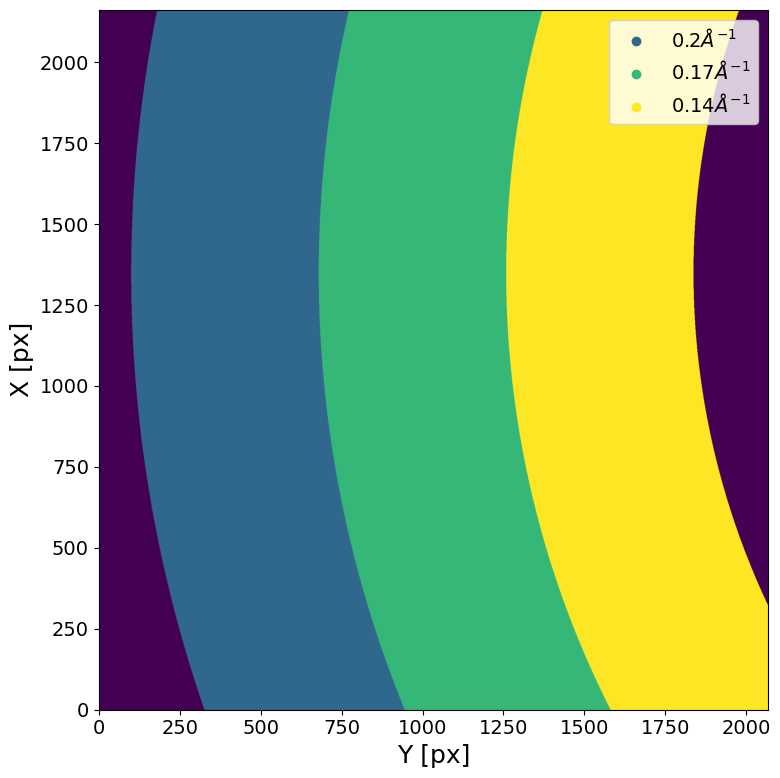

In [21]:
###################
Qs_section = [.2, .17, .14]
dQ_section = .015
###################

Qmask = XPCS.gen_Qmask(Ei, theta, Qs_section, dQ_section, Qmap_plot=False)

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  2159 pixels (of 4471016 => 0.05 %)
################################################################################



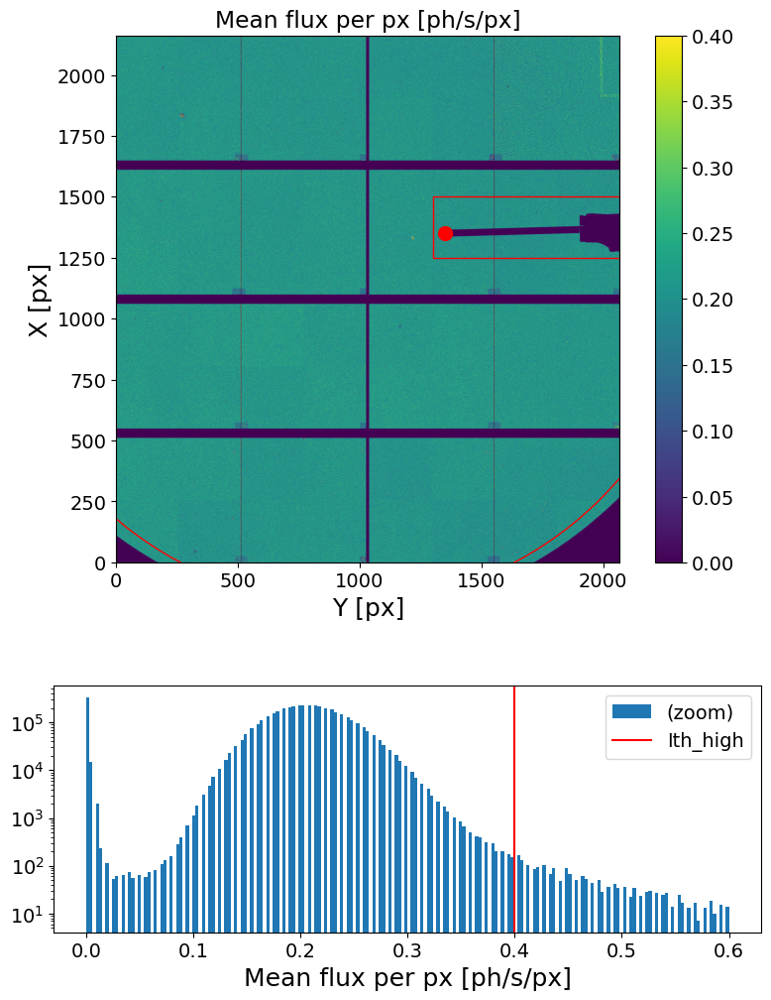

#################################################
Masked area =  93.74594052000708 %
#################################################



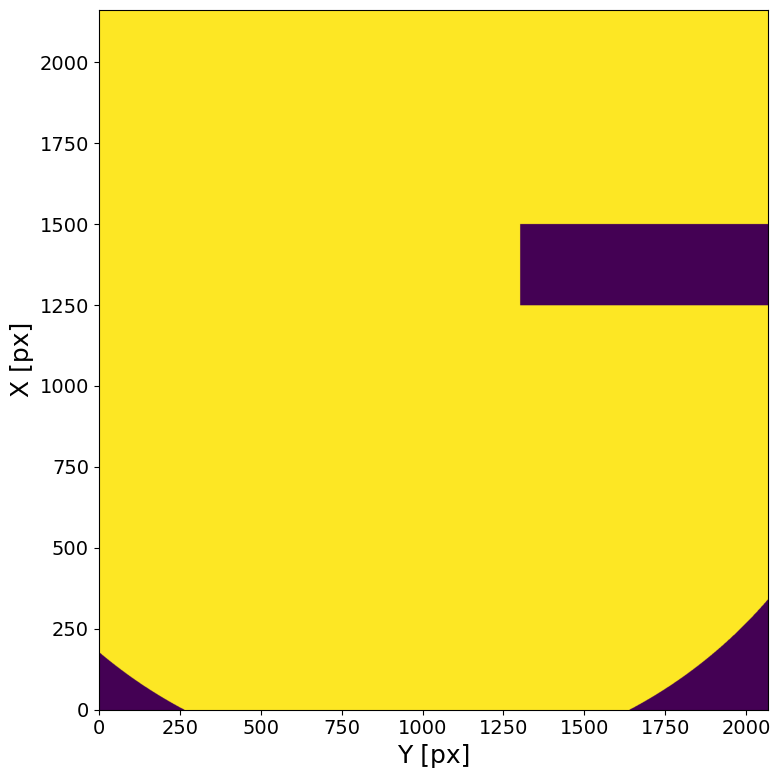

In [22]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.4, Nff=10000, mask_geom=geom,)
bs_mask = XPCS.gen_mask(mask_geom=geom)

### Intensity analysis

In [23]:
####################
Lbin = 100
Nstep = 1000
Nfi = 15
####################

It = {}
for q in Qmask.keys():
    mask= e4m_mask * e4m_htmask * bs_mask * Qmask[q]
    It[q] = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Nfi=Nfi, Lbin=Lbin, Nstep=Nstep))
    np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", It[q])

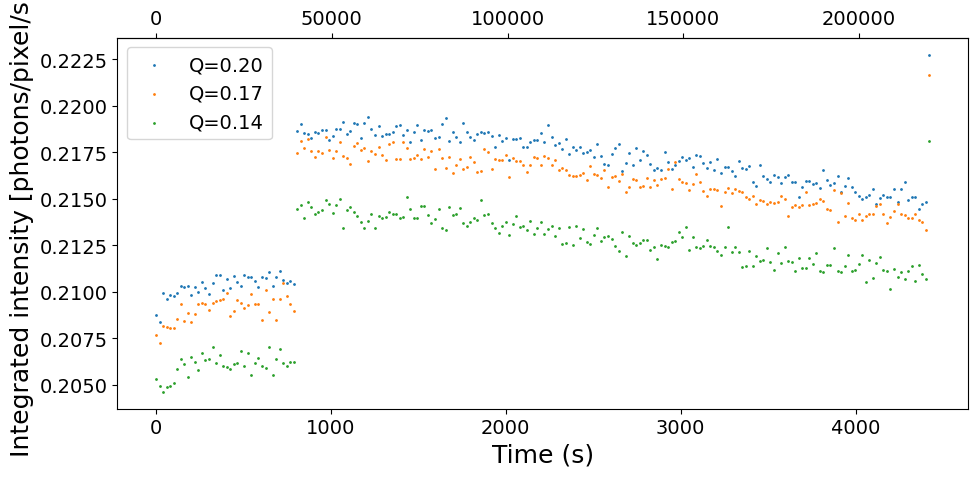

In [24]:
plt.figure(figsize=(10,5))
for q in Qmask.keys():
    plt.scatter(It[q][0], It[q][1], label='Q={:.2f}'.format(q), s=1)
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.legend()
plt.tight_layout(); plt.show()

### Linear Correlation by Dose

In [25]:
###################
Nfi = 20
Nff = 10000
Lbin = 3
###################
if Lbin is None: Lbin=1

G2t = {}
for q in tqdm(Qs_section, desc='Calculating G2'):
    with redirect_stdout(io.StringIO()):
        mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
        G2t[q] = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin)

Calculating G2: 100%|██████████| 3/3 [00:31<00:00, 10.45s/it]


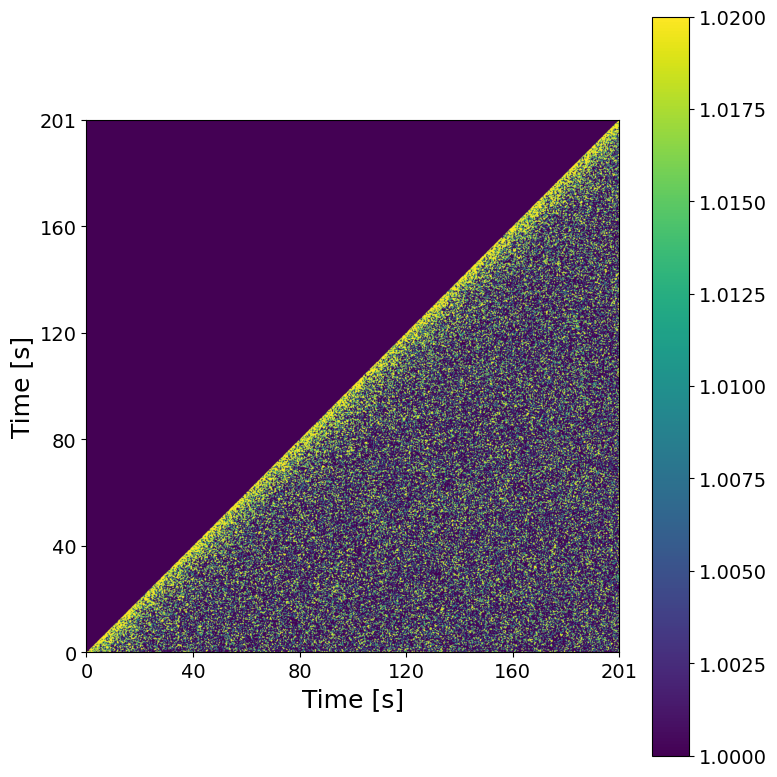

In [26]:
############################
q = .2
t1, t2 = None, None
vmin, vmax = 1.0, 1.02
############################
XPCS.plot_G2t(G2t[q], vmin, vmax, itime=itime*Lbin, t1=t1, t2=t2, sigma_filter=2)

In [27]:
################
Nbunch = 5
################

NfXbunch = int(G2t[q].shape[0]/Nbunch)
g2 = {}
for q in tqdm(Qs_section):
    g2[q] = {}
    for n in range(Nbunch):
        t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
        with redirect_stdout(io.StringIO()):
            g2[q][t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[q][NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

100%|██████████| 3/3 [00:00<00:00, 73.39it/s]


Using Global variables: Nbunch, model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan 

###### Q = 0.2 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
20.0,0.2,0.015,5.087644,0.408887,8.036854,0.917691,0.077296,8.422934,0.029057,0.001536,5.287584,1.0023,0.0,0.0,1.197134
60.1,0.2,0.015,6.007340,0.379217,6.312553,1.067002,0.088008,8.248169,0.026193,0.001200,4.580341,1.0023,0.0,0.0,1.113542
100.2,0.2,0.015,5.160877,0.438973,8.505789,0.850973,0.068681,8.070935,0.028634,0.001526,5.330694,1.0023,0.0,0.0,1.040995
140.3,0.2,0.015,5.156452,0.387820,7.521067,0.901034,0.069485,7.711670,0.029638,0.001452,4.899890,1.0023,0.0,0.0,1.041318
180.4,0.2,0.015,5.715630,0.413050,7.226670,0.928177,0.072560,7.817438,0.028049,0.001347,4.803881,1.0023,0.0,0.0,1.038569


###### Q = 0.17 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
20.0,0.17,0.015,5.382814,0.467621,8.687293,0.817596,0.064310,7.865770,0.029468,0.001564,5.306763,1.0023,0.0,0.0,1.000877
60.1,0.17,0.015,4.876205,0.396861,8.138723,0.836829,0.062632,7.484403,0.031463,0.001587,5.042737,1.0023,0.0,0.0,0.985959
100.2,0.17,0.015,5.036833,0.393948,7.821351,0.827491,0.059075,7.139035,0.031446,0.001507,4.793739,1.0023,0.0,0.0,0.930419
140.3,0.17,0.015,5.556199,0.430763,7.752840,0.865799,0.066050,7.628812,0.028911,0.001418,4.905047,1.0023,0.0,0.0,0.990333
180.4,0.17,0.015,5.319474,0.453951,8.533757,0.856607,0.070338,8.211181,0.029856,0.001602,5.366307,1.0023,0.0,0.0,1.159585


###### Q = 0.14 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
20.0,0.14,0.015,6.092261,0.532306,8.737406,0.852269,0.073023,8.568126,0.031718,0.001736,5.472533,1.0023,0.0,0.0,1.191336
60.1,0.14,0.015,5.708290,0.535999,9.389834,0.814905,0.069983,8.587902,0.030835,0.001759,5.705336,1.0023,0.0,0.0,1.047640
100.2,0.14,0.015,5.490956,0.526729,9.592656,0.800457,0.068213,8.521695,0.032054,0.001848,5.766757,1.0023,0.0,0.0,1.076196
140.3,0.14,0.015,5.693310,0.481827,8.463038,0.826306,0.064876,7.851271,0.031977,0.001665,5.205771,1.0023,0.0,0.0,0.951309
180.4,0.14,0.015,5.873312,0.591811,10.076282,0.818736,0.076333,9.323320,0.032120,0.001977,6.153644,1.0023,0.0,0.0,1.377847


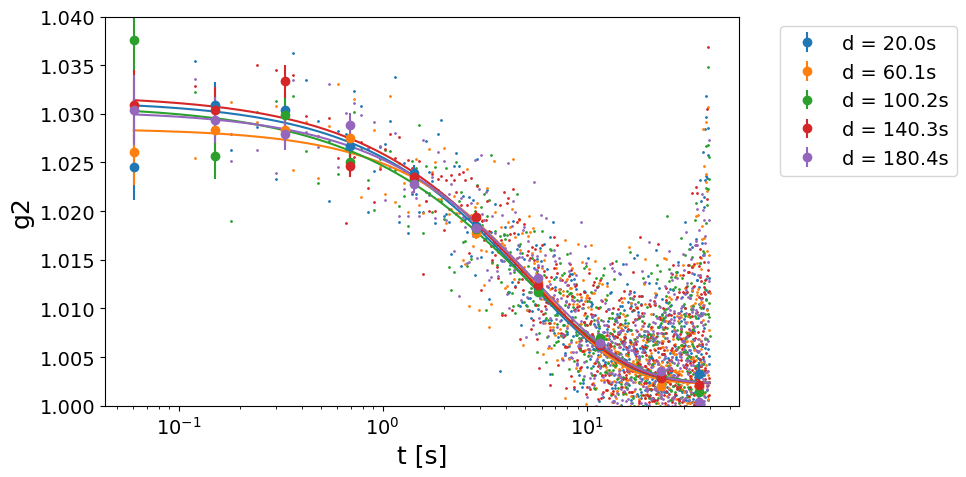

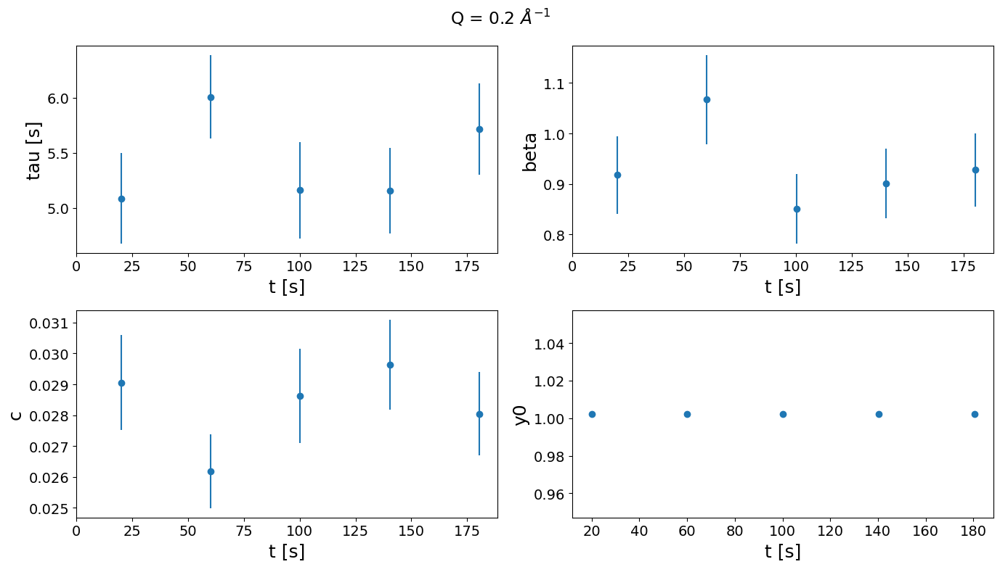

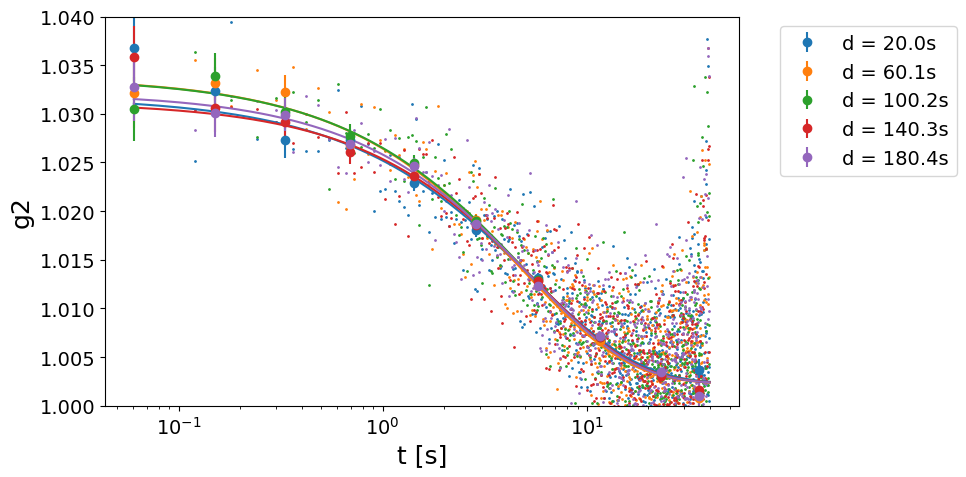

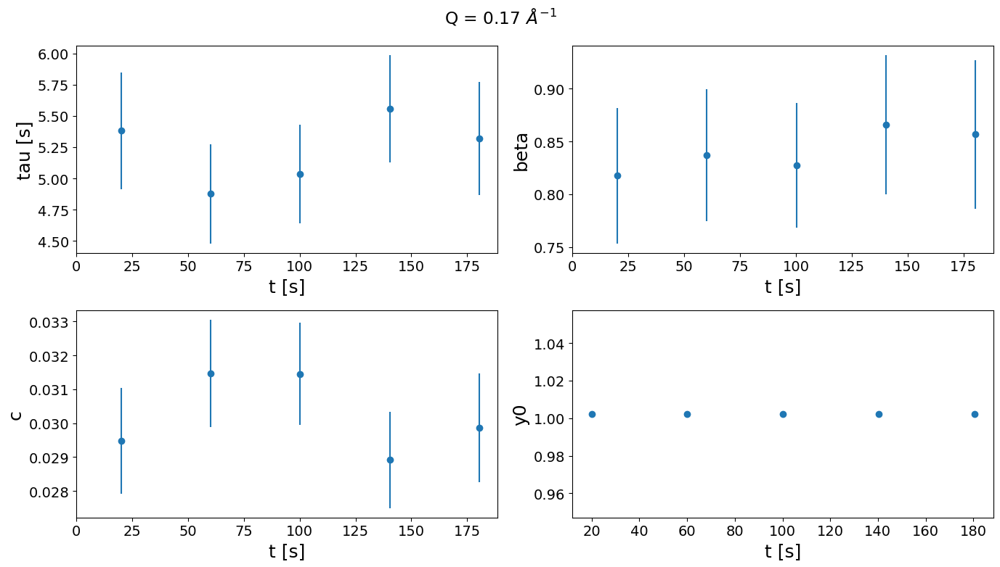

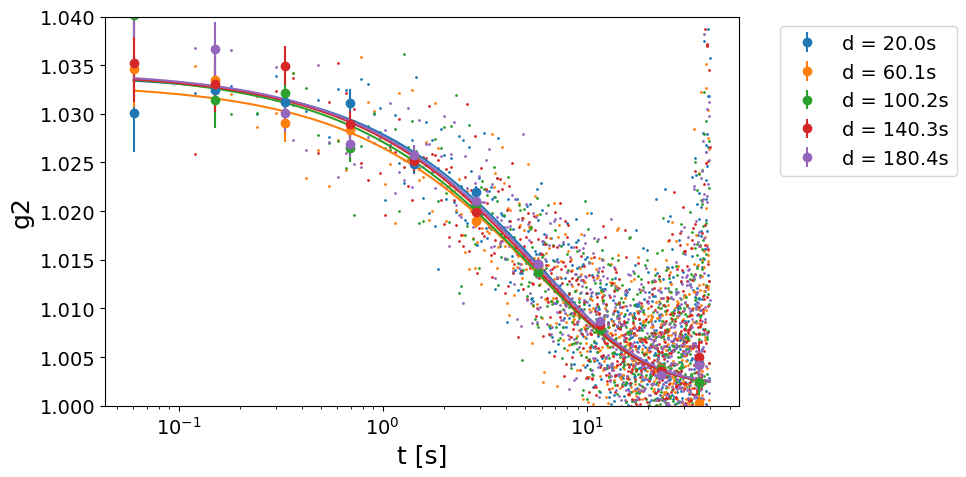

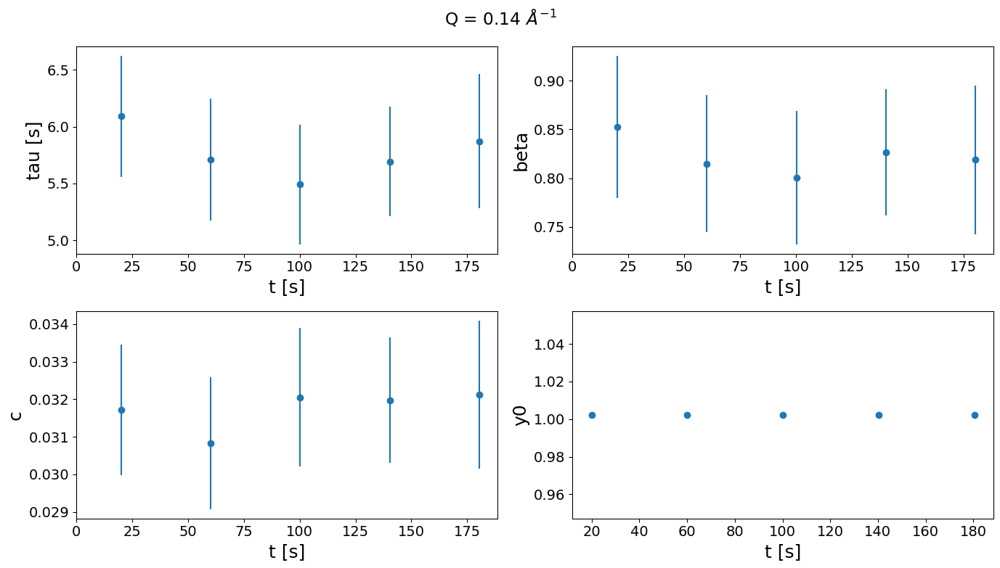

In [28]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
params.add('y0', value=1.0023, vary=False)
##############################################

plotfit_byQ_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [ ]:
Nfi = 25000

g2 = {}
for q in tqdm(Qmask.keys()):
    with redirect_stdout(io.StringIO()):
        mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
        G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=None, Lbin=None)
        g2[q] = np.vstack(XPCS.get_g2(itime, G2t))
        np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", g2[q])

 33%|███▎      | 1/3 [05:30<11:01, 330.64s/it]

Using Global variables: model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan



,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.20,0.015,5.183576,0.039304,0.758232,0.733505,0.003841,0.523621,0.030873,0.000132,0.427484,1.002292,0.000002,0.000162,0.999893
1,0.17,0.015,5.420875,0.040870,0.753930,0.718032,0.003620,0.504180,0.031566,0.000132,0.418881,1.002289,0.000002,0.000163,0.996690
2,0.14,0.015,5.787719,0.048194,0.832699,0.711675,0.003912,0.549624,0.032429,0.000149,0.459833,1.002959,0.000002,0.000189,0.993676


Using Global variables: sample_name, Ndataset, Nscan 



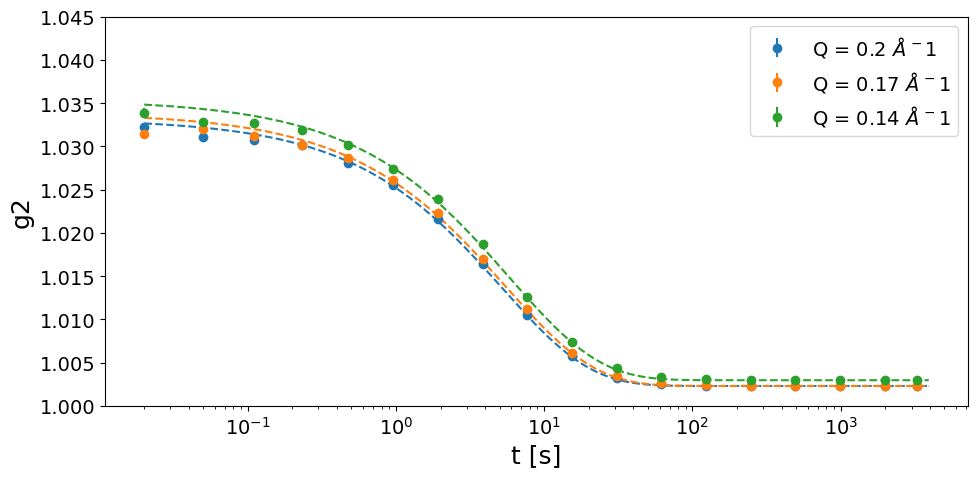

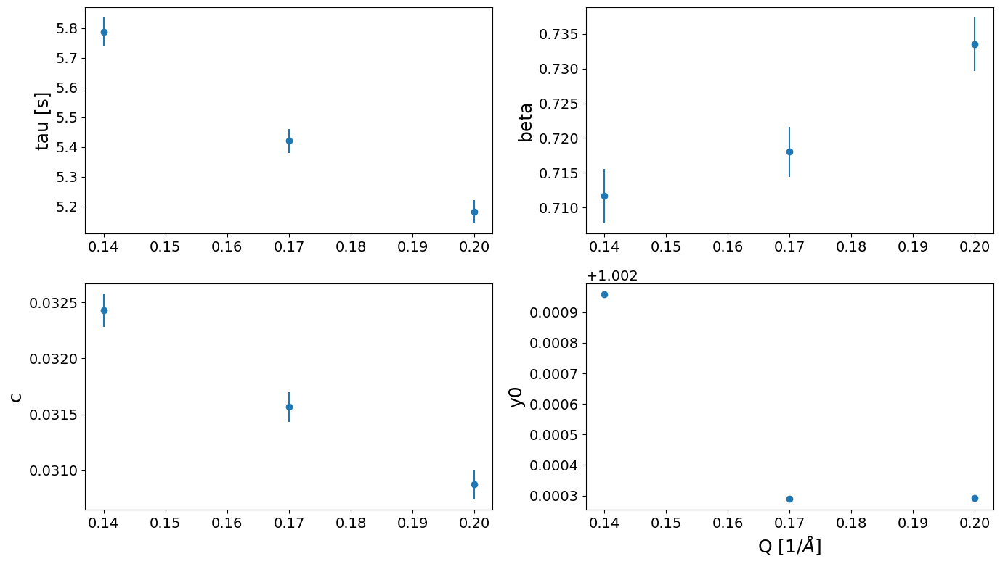

In [ ]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.03)
#params.add('y0', value=1.0023, vary=False)
##############################################

g2fit, fig, ax = plotfit_byQ_4damaged_vGeO2(itime, g2, t1_fit, t2_fit, save=True)
ax.set_ylim(1, 1.045)
ax.legend()
fig.tight_layout(); fig.show()

fig, axs = plotfitparams_byQ_4damaged_vGeO2(g2fit)
fig.tight_layout(); fig.show()

### Multitau correlation of damaged-vGeO2

In [ ]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 219999    =>    log2(Nf) = 17.75
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**17                 16             40.4          88927
1    3*2**16                 15             11.0          23391
2   13*2**14                 13              3.0           7007
3   53*2**12                 11              1.0           2911
4  107*2**11                 10              0.0            863
----------------------------------------------------


In [ ]:
##### INPUTS #####
Nfi = 20000
Nff = Nfi +  3*2**16
sparse_depth = 12
dense_depth = 15
##################

G2tmt, g2mt = {}, {}
for q in tqdm(Qmask.keys(), desc=f'Calculating G2tmt @ q={q}'):
    mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
    G2tmt[q] = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)
    g2mt[q] = np.vstack(XPCS.get_g2mt(itime, G2tmt[q]))
    np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", g2mt[q])

Calculating G2tmt @ q=0.14:   0%|          | 0/3 [00:00<?, ?it/s]

Loading frames ...


Done! (elapsed time = 36.41 s)
Masking data ...
Done! (elapsed time = 76.71 s)
	 | 196608 frames X 1089796 pixels
	 | sparsity = 4.35e-03
	 | memory usage (sparse.csr_array @ float32) = 10.416 GB
Computing sparse multitau G2t...


100%|██████████| 48/48 [01:40<00:00,  2.10s/it]


Done! (elapsed time = 100.96 s)
Computing dense multitau G2t...


Calculating G2tmt @ q=0.14:  33%|███▎      | 1/3 [03:34<07:08, 214.28s/it]

Done! (elapsed time = 0.14 s)
Loading frames ...
Done! (elapsed time = 36.64 s)
Masking data ...
Done! (elapsed time = 71.58 s)
	 | 196608 frames X 1076890 pixels
	 | sparsity = 4.33e-03
	 | memory usage (sparse.csr_array @ float32) = 10.243 GB
Computing sparse multitau G2t...


100%|██████████| 48/48 [01:39<00:00,  2.07s/it]


Done! (elapsed time = 99.67 s)
Computing dense multitau G2t...


Calculating G2tmt @ q=0.14:  67%|██████▋   | 2/3 [07:02<03:30, 210.62s/it]

Done! (elapsed time = 0.14 s)
Loading frames ...
Done! (elapsed time = 38.15 s)
Masking data ...
Done! (elapsed time = 64.58 s)
	 | 196608 frames X 817350 pixels
	 | sparsity = 4.28e-03
	 | memory usage (sparse.csr_array @ float32) = 7.691 GB
Computing sparse multitau G2t...


100%|██████████| 48/48 [01:12<00:00,  1.51s/it]


Done! (elapsed time = 72.52 s)
Computing dense multitau G2t...


Calculating G2tmt @ q=0.14: 100%|██████████| 3/3 [09:57<00:00, 199.24s/it]

Done! (elapsed time = 0.1 s)


<>:13: SyntaxWarning: invalid escape sequence '\s'
<>:13: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_599024/2507261023.py:13: SyntaxWarning: invalid escape sequence '\s'
  plt.ylabel('$\sigma_{g2}$')


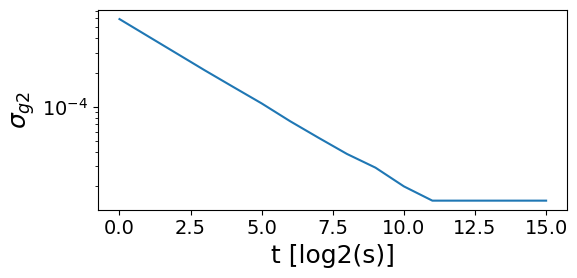

In [ ]:
# Cure the std divergence
for q in g2mt.keys():
    g2mt[q][2][-1] = g2mt[q][2][-5]
    g2mt[q][2][-2] = g2mt[q][2][-5]
    g2mt[q][2][-3] = g2mt[q][2][-5]
    g2mt[q][2][-4] = g2mt[q][2][-5]

# plot
plt.figure(figsize=(6, 3))
plt.plot(g2mt[q][2])
plt.yscale('log')
plt.xlabel('t [log2(s)]')
plt.ylabel('$\sigma_{g2}$')
plt.tight_layout(); plt.show()

#### Check of the dose-independence

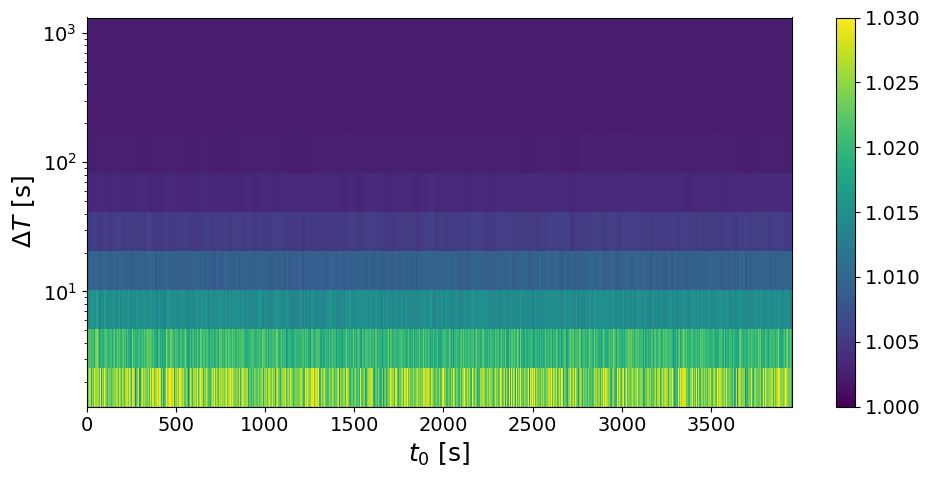

In [ ]:
############################
q = .2
vmin, vmax = 1.0, 1.03
lower_mt = 6
filter_layer = 6
############################

XPCS.plot_G2tmt(G2tmt[q], itime, vmin, vmax, yscale='log', lower_mt=lower_mt, filter_layer=filter_layer)

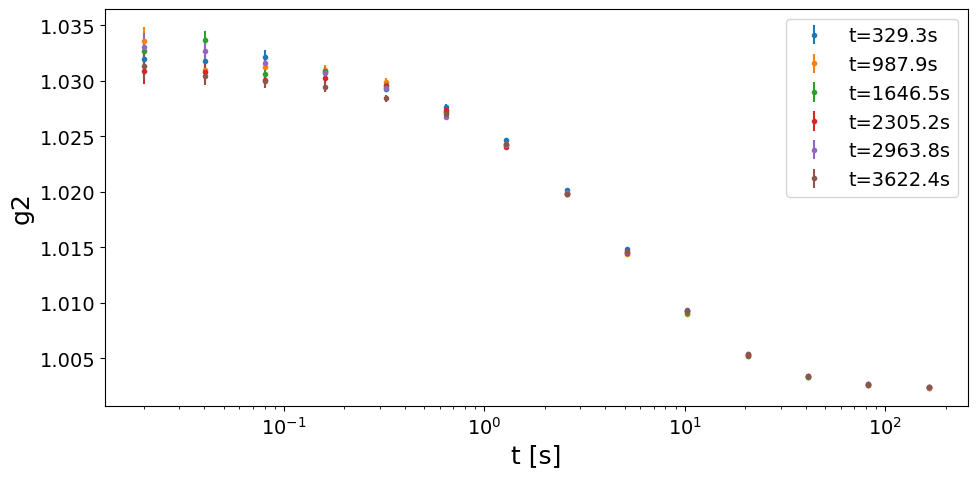

In [ ]:
################
Nbunch = 6
################

NfXbunch = int(G2tmt[q][0].shape[0]/Nbunch)
g2mt_cuts = {}
for n in range(Nbunch):
    t_bunch = round(itime*NfXbunch*(n+1/2),1)
    G2tmt_cuts = XPCS.cut_G2tmt(itime, G2tmt[q], tmin=itime*NfXbunch*n, tmax=itime*NfXbunch*(n+1))
    g2mt_cuts[t_bunch] = XPCS.get_g2mt(itime, G2tmt_cuts)

### PLOT ###
fig, ax = plt.subplots(figsize=(10, 5))
for n in g2mt_cuts.keys():
    ax.errorbar(g2mt_cuts[n][0], g2mt_cuts[n][1], yerr=g2mt_cuts[n][2], fmt='o', label=f't={n}s', markersize=3)
ax.set_xlabel('t [s]')
ax.set_ylabel('g2')
ax.set_xscale('log')
ax.legend()
fig.tight_layout()
plt.show()

#### Fit

Using Global variables: model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan



,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.20,0.015,5.264310,0.315167,5.986860,0.633138,0.022499,3.553643,0.032371,0.001011,3.123026,1.002394,0.000047,0.004725,59.403883
1,0.17,0.015,5.580072,0.366679,6.571229,0.630807,0.024429,3.872654,0.032776,0.001119,3.415054,1.002423,0.000054,0.005389,75.177258
2,0.14,0.015,6.027960,0.385215,6.390463,0.631909,0.024174,3.825490,0.033482,0.001107,3.306555,1.003098,0.000059,0.005904,56.465009


Using Global variables: sample_name, Ndataset, Nscan 



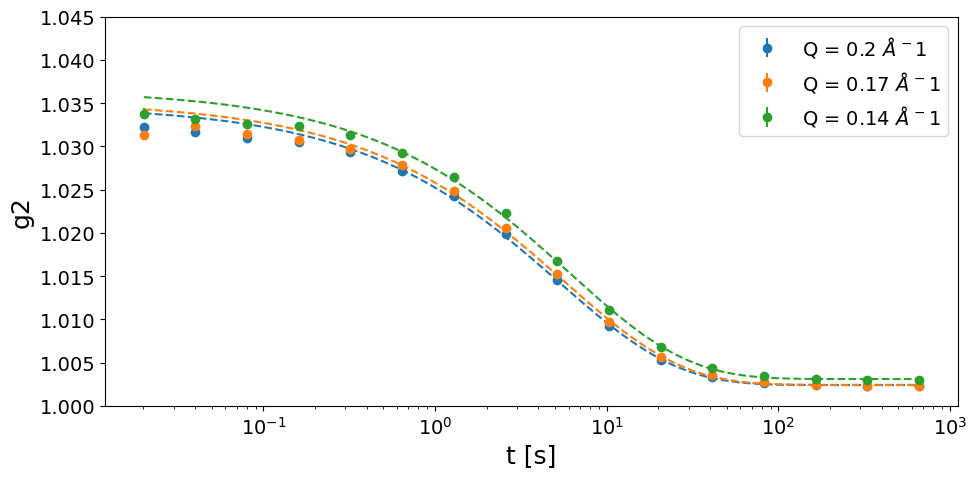

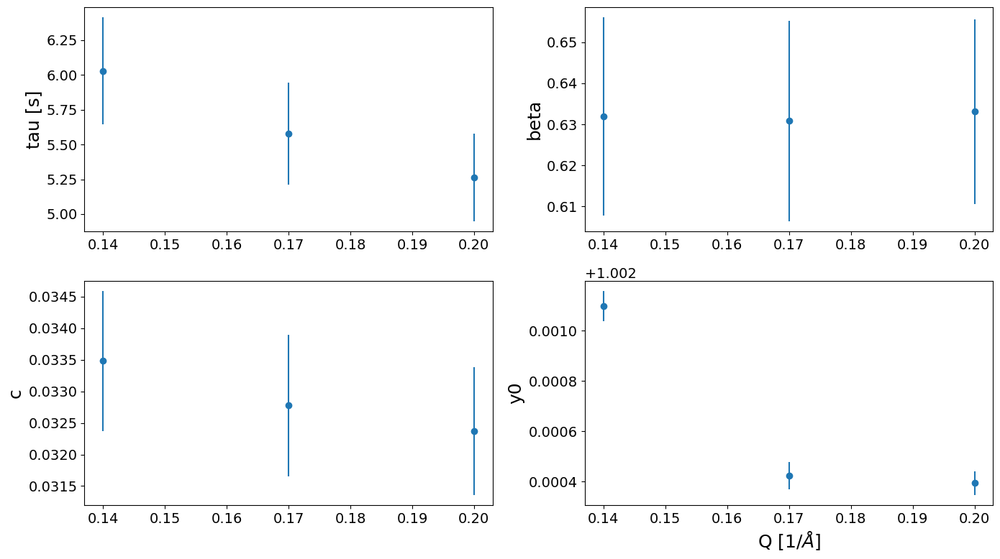

In [ ]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.03)
#params.add('y0', value=1.0023, vary=False)
##############################################

g2fit, fig, ax = plotfit_byQ_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True, mt=True)
ax.set_ylim(1, 1.045)
ax.legend()
fig.tight_layout(); fig.show()

fig, axs = plotfitparams_byQ_4damaged_vGeO2(g2fit)
fig.tight_layout(); fig.show()

##   XPCS scan: delcoup = 1.00, T=30, 60min @ 1ms (3600000fm, stopped @ 2600000) (GeO2_6q_delcoup1, dataset 1, scan 2)

**ATTENZIONE!!!**
Le due strisciate in basso sul detector cambiano il tau da 5 a 1 s!!!

In [ ]:
#######################################
sample_name = 'GeO2_6q_delcoup_1'
Ndataset = 1
Nscan = 2
Nfi, Nff = None, 2600000 # NO BEAM @ 2600000 frames
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 3599664
Ei = 9.699998837562536
itime = 0.0011
theta = 1.0000000000000004
Q = 0.09
T = 60.76 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00025.h5 (26/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00040.h5 (41/521 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00041

### Qmask

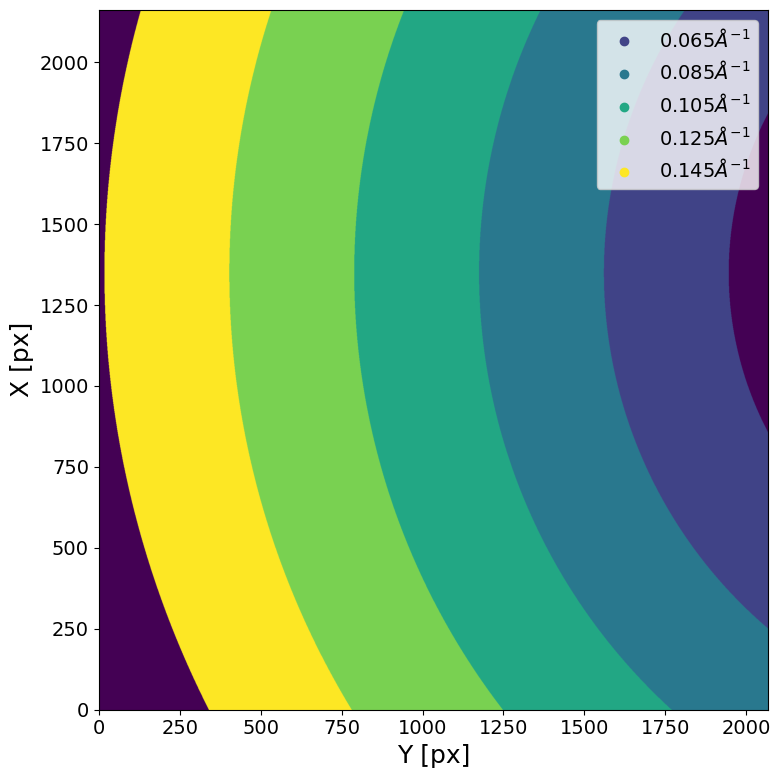

In [ ]:
###################
Qs_section = [.065, .085, .105, .125, .145,]
dQ_section = .01
###################

Qmask = XPCS.gen_Qmask(Ei, theta, Qs_section, dQ_section, Qmap_plot=False)

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  222445 pixels (of 4471016 => 4.98 %)
# of pixels below Ith_low treshold ->  941892 pixels (of 4471016 => 21.07 %)
################################################################################



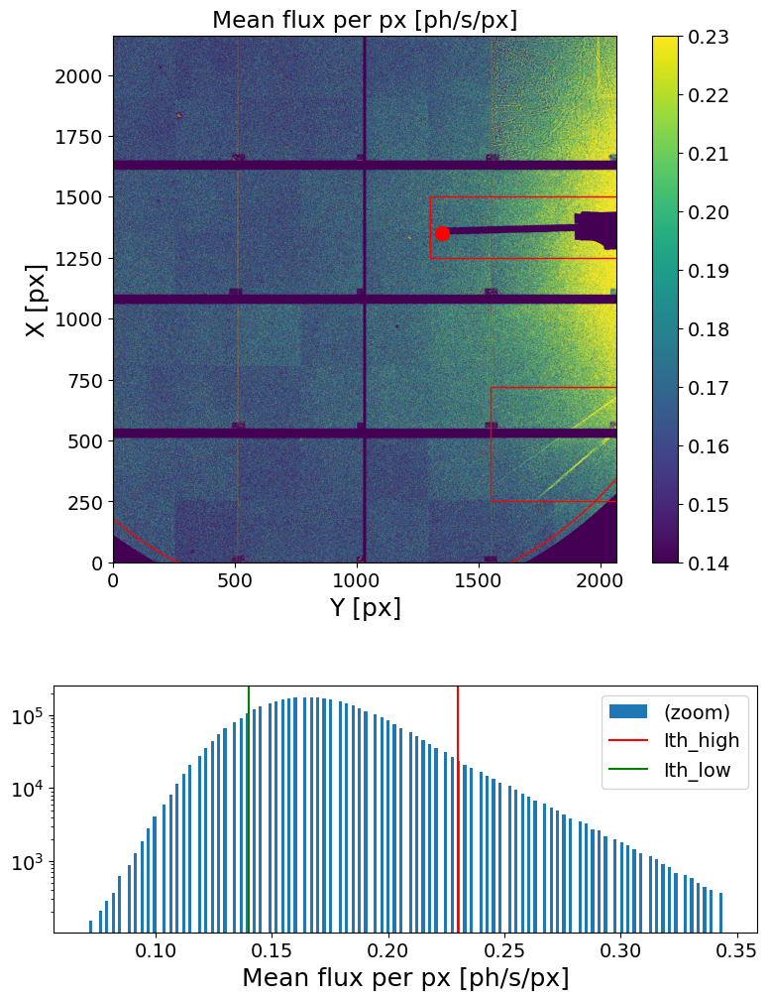

#################################################
Masked area =  88.38167879515528 %
#################################################



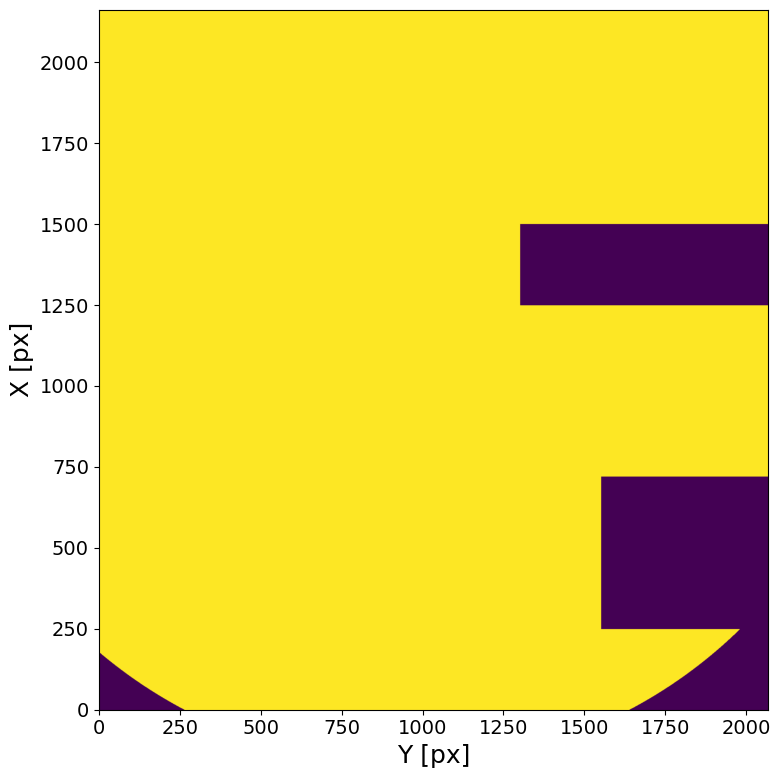

In [ ]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Rectangle', 'x0':250, 'y0':1550, 'xl':470, 'yl':2000, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_low = .14, Ith_high=.23, Nff=300000, mask_geom=geom,)
bs_mask = XPCS.gen_mask(mask_geom=geom)

### Intensity analysis

In [ ]:
####################
Lbin = 100
Nstep = 1000
Nfi = 15
Nff=None
####################

It = {}
for q in Qmask.keys():
    mask= e4m_mask * e4m_htmask * bs_mask * Qmask[q]
    It[q] = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nstep=Nstep))
    np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", It[q])

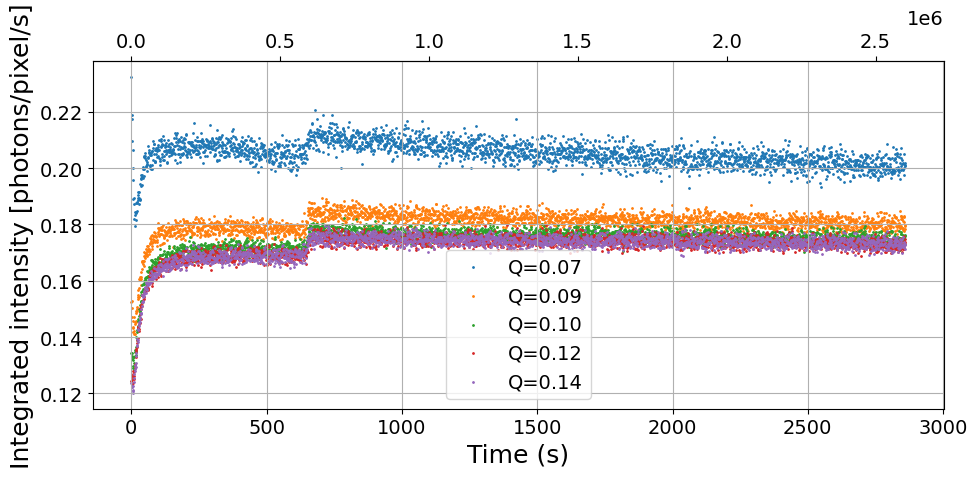

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
for q in Qmask.keys():
    ax.scatter(It[q][0], It[q][1], label='Q={:.2f}'.format(q), s=1)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Integrated intensity [photons/pixel/s]')
ax.secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
ax.grid()
#ax.set_xlim(0, 100)
ax.legend()
fig.tight_layout()
plt.show()

### Linear Correlation by Dose

In [ ]:
###################
Nfi = 20
Nff = int(0.1e6)
Lbin = 10
###################
if Lbin is None: Lbin=1

G2t = {}
for q in tqdm(Qs_section, desc='Calculating G2'):
    with redirect_stdout(io.StringIO()):
        mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
        G2t[q] = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin)

Calculating G2: 100%|██████████| 5/5 [00:19<00:00,  3.89s/it]


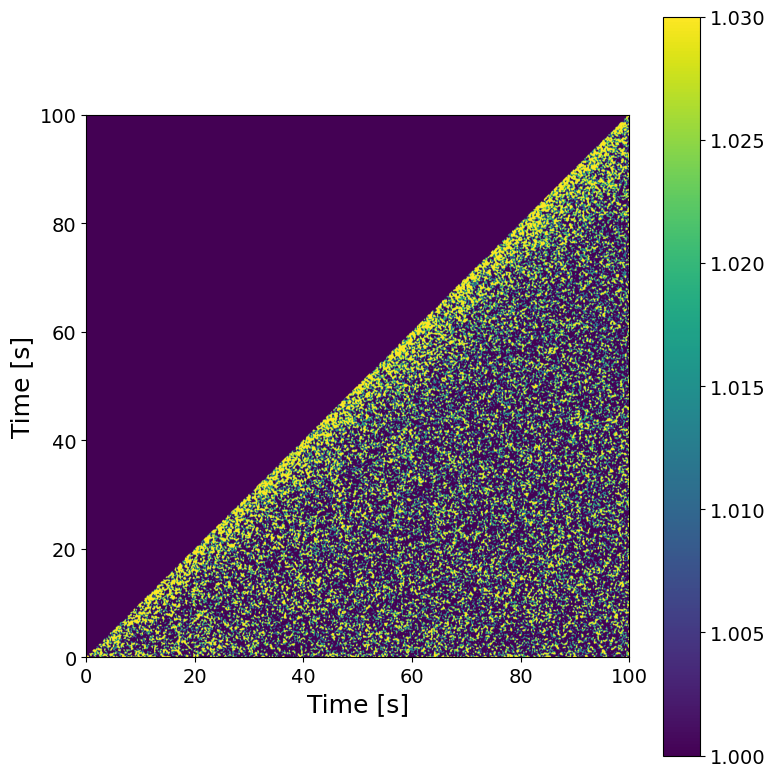

In [ ]:
############################
q = .105
t1, t2 = None, 100
vmin, vmax = 1.0, 1.03
############################
XPCS.plot_G2t(G2t[q], vmin, vmax, itime=itime*Lbin, t1=t1, t2=t2, sigma_filter=10)

In [ ]:
################
Nbunch = 5
################

NfXbunch = int(G2t[q].shape[0]/Nbunch)
g2 = {}
for q in tqdm(Qs_section):
    g2[q] = {}
    for n in range(Nbunch):
        t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
        with redirect_stdout(io.StringIO()):
            g2[q][t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[q][NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

100%|██████████| 5/5 [00:00<00:00, 24.29it/s]


Using Global variables: Nbunch, model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan 

###### Q = 0.065 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
11.0,0.065,0.01,10.000000,6.237694,62.376936,0.849115,0.313436,36.913278,0.048118,0.018404,38.246747,1.010000,0.015322,1.517020,1.032821
33.0,0.065,0.01,10.000000,5.890118,58.901180,0.954198,0.374163,39.212233,0.039254,0.015460,39.384015,1.006691,0.012979,1.289245,1.051085
55.0,0.065,0.01,10.000000,10.553054,105.530542,0.646780,0.310215,47.963023,0.050371,0.026647,52.900785,1.001116,0.021721,2.169717,1.000579
77.0,0.065,0.01,7.382311,5.305022,71.861257,0.708154,0.348858,49.262978,0.039707,0.017373,43.754128,1.010000,0.012736,1.260983,1.193675
99.0,0.065,0.01,10.000000,4.702359,47.023587,1.096493,0.406772,37.097529,0.038623,0.013492,34.932259,1.004881,0.011356,1.130050,1.452434


###### Q = 0.085 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
11.0,0.085,0.01,5.878610,0.580976,9.882884,1.866846,0.464883,24.902078,0.025455,0.002659,10.445621,1.003492,0.001408,0.140303,0.990849
33.0,0.085,0.01,5.708699,0.996561,17.456883,1.060702,0.272877,25.726094,0.034720,0.005459,15.721728,1.002708,0.003192,0.318385,1.037148
55.0,0.085,0.01,7.454261,1.287407,17.270749,1.297492,0.326947,25.198365,0.029579,0.004683,15.830989,1.002173,0.003310,0.330315,0.997505
77.0,0.085,0.01,5.198903,0.655423,12.606942,1.290051,0.301657,23.383358,0.028071,0.003386,12.062375,1.007187,0.001681,0.166861,1.049918
99.0,0.085,0.01,6.864085,1.778524,25.910577,1.075558,0.349917,32.533541,0.027360,0.006001,21.935321,1.006128,0.004098,0.407338,1.090544


###### Q = 0.105 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
11.0,0.105,0.01,4.031003,0.402429,9.983349,2.000000,0.556810,27.840523,0.022052,0.002327,10.554517,1.004469,0.000894,0.088953,1.005279
33.0,0.105,0.01,4.988321,0.624978,12.528825,1.188069,0.260432,21.920602,0.030164,0.003569,11.832088,1.002810,0.001748,0.174308,1.022920
55.0,0.105,0.01,6.839102,1.817628,26.576996,1.185399,0.453894,38.290443,0.031650,0.007567,23.907764,1.000000,0.005027,0.502674,3.189384
77.0,0.105,0.01,7.135259,1.695344,23.760091,0.984377,0.249049,25.300160,0.033735,0.006278,18.610593,1.000031,0.004465,0.446438,1.004061
99.0,0.105,0.01,3.441416,1.112548,32.328208,1.263966,0.737243,58.327739,0.025875,0.007537,29.129883,1.010000,0.002416,0.239253,7.295877


###### Q = 0.125 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
11.0,0.125,0.01,3.578046,0.817583,22.849992,0.881015,0.288491,32.745279,0.030470,0.006054,19.869443,1.001599,0.002318,0.231388,1.026271
33.0,0.125,0.01,4.600101,0.772743,16.798390,0.946998,0.235715,24.890771,0.033395,0.005050,15.122030,1.000000,0.002476,0.247563,0.976476
55.0,0.125,0.01,6.492365,1.683479,25.930134,1.761406,1.150691,65.328002,0.028820,0.007193,24.959502,1.000000,0.002372,0.237155,18.935041
77.0,0.125,0.01,6.050947,1.781902,29.448325,1.193181,0.570077,47.777939,0.032102,0.008816,27.463159,1.000000,0.005193,0.519278,5.795005
99.0,0.125,0.01,6.602474,1.590009,24.082022,0.958514,0.260569,27.184631,0.032215,0.006208,19.271542,1.000000,0.004196,0.419623,1.042730


###### Q = 0.145 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
11.0,0.145,0.01,3.458388,0.777368,22.477745,1.082888,0.390446,36.056011,0.026994,0.005302,19.641284,1.000000,0.001757,0.175680,1.425343
33.0,0.145,0.01,3.188660,0.691110,21.674009,0.766311,0.217143,28.336186,0.036440,0.006686,18.347201,1.000958,0.002446,0.244318,1.017700
55.0,0.145,0.01,5.779917,1.652058,28.582725,0.815243,0.248334,30.461306,0.034649,0.007645,22.062752,1.000000,0.004813,0.481262,0.995825
77.0,0.145,0.01,4.980246,1.103418,22.155903,0.797863,0.212930,26.687540,0.038577,0.007060,18.300765,1.000000,0.003929,0.392883,1.079056
99.0,0.145,0.01,5.484719,1.664399,30.346120,0.766904,0.244157,31.836730,0.035548,0.008272,23.269694,1.000000,0.005049,0.504894,1.086276


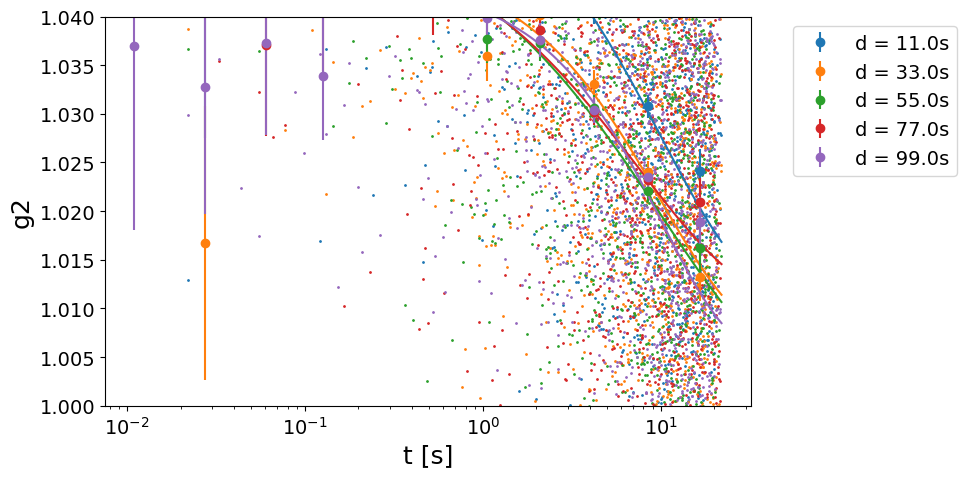

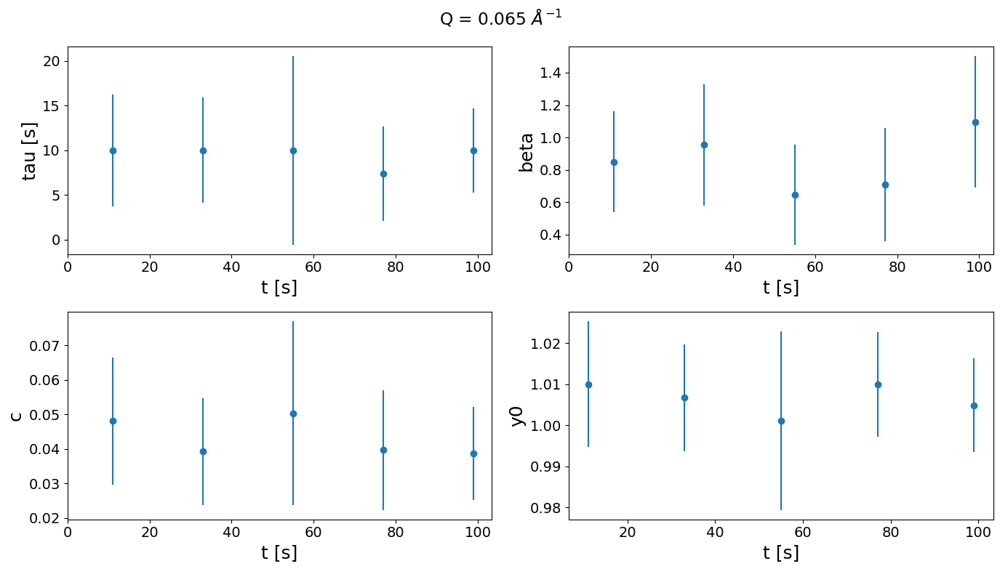

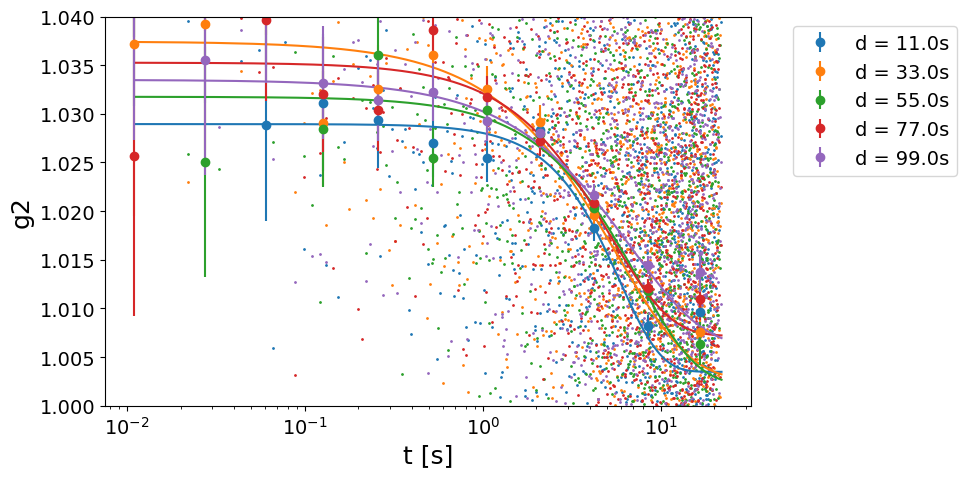

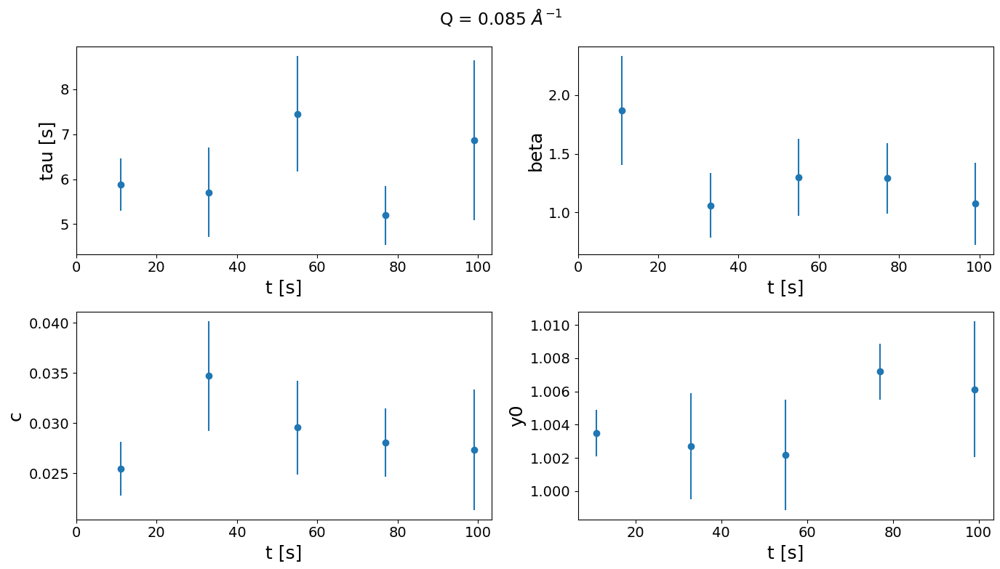

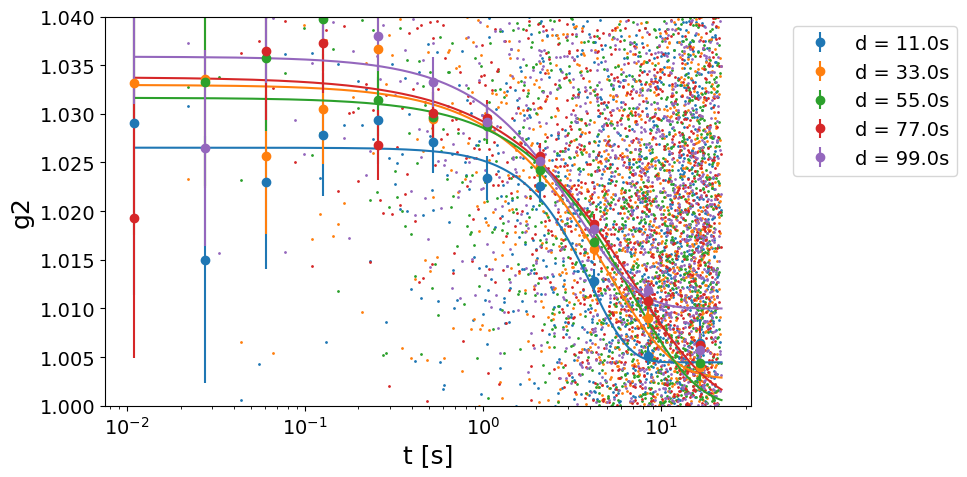

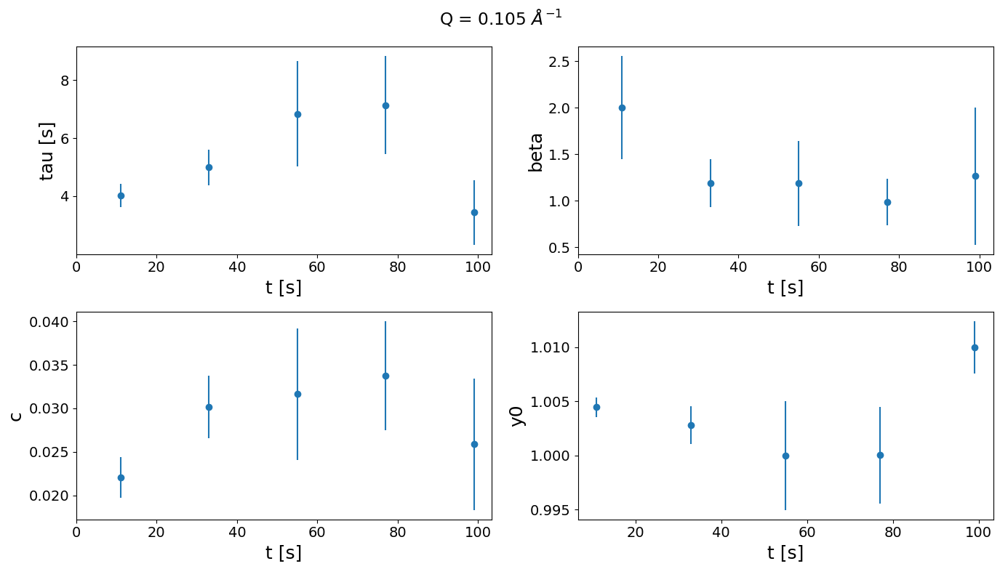

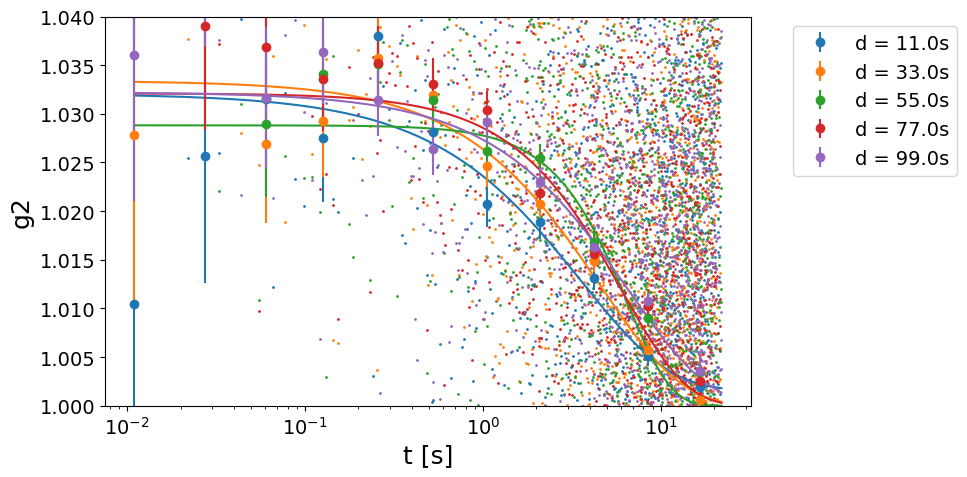

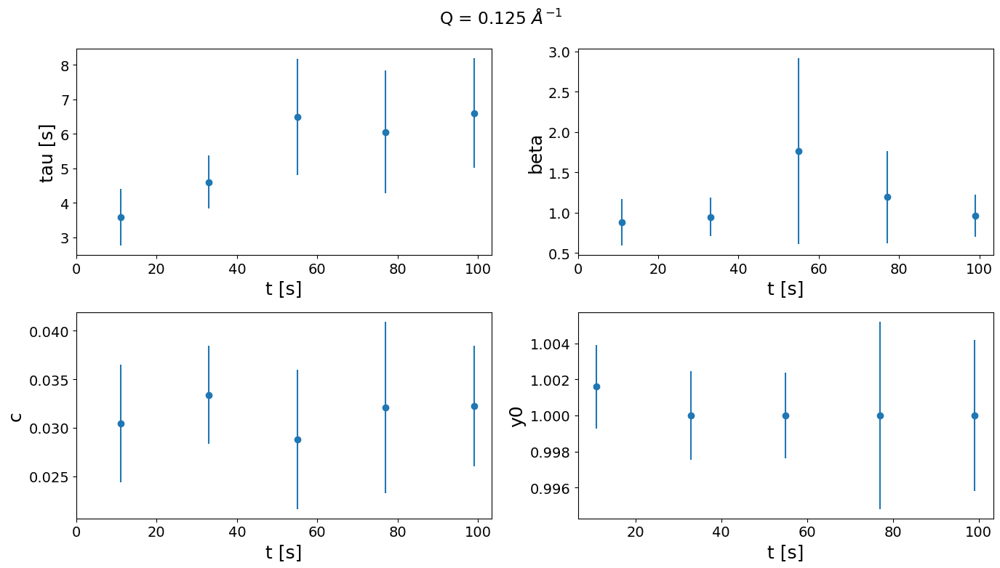

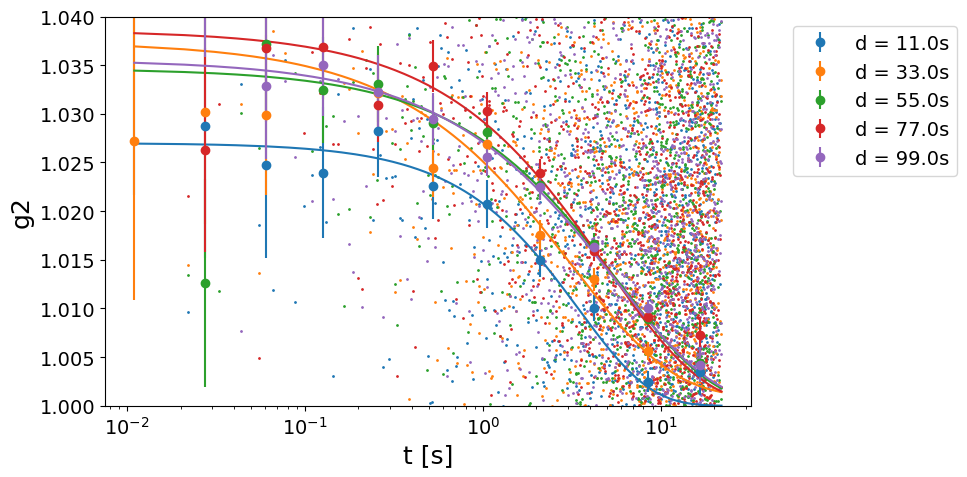

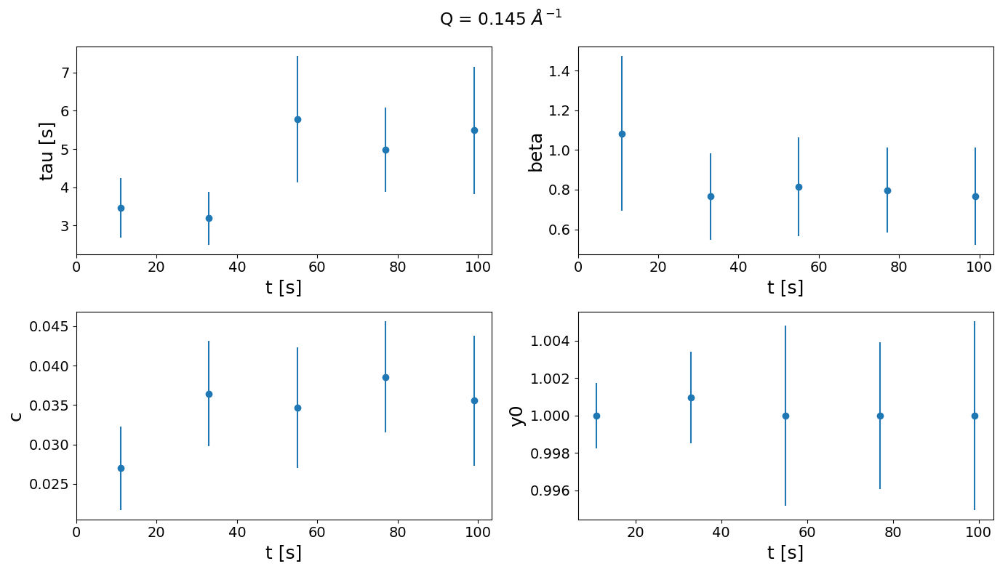

In [ ]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.0023, vary=False)
##############################################

plotfit_byQ_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Multitau correlation of damaged-vGeO2

In [ ]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 2600000    =>    log2(Nf) = 21.31
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**21                 20             19.3         502848
1    9*2**18                 17              9.0         240704
2   19*2**17                 16              4.0         109632
3   39*2**16                 15              2.0          44096
4   79*2**15                 14              0.0          11328
5  317*2**13                 12              0.0           3136
----------------------------------------------------


In [ ]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = Nfi +  2**21
sparse_depth = 12
dense_depth = 20
##################

G2tmt, g2mt = {}, {}
for q in tqdm(Qmask.keys(), desc=f'Calculating G2tmt @ q={q}'):
    mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
    G2tmt[q] = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)
    g2mt[q] = np.vstack(XPCS.get_g2mt(itime, G2tmt[q]))
    np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", g2mt[q])

100%|██████████| 5/5 [14:12<00:00, 170.42s/it]


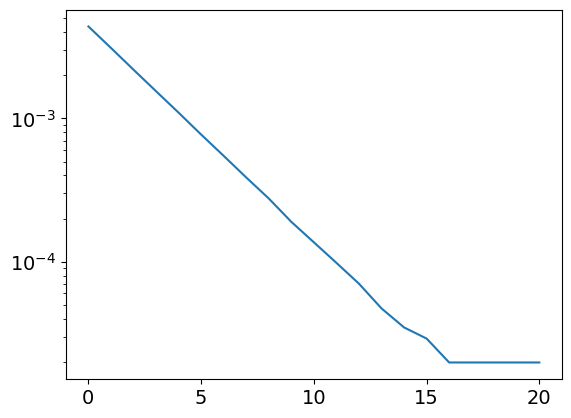

In [ ]:
# Cure the std divergence
for q in g2mt.keys():
    g2mt[q][2][-1] = g2mt[q][2][-5]
    g2mt[q][2][-2] = g2mt[q][2][-5]
    g2mt[q][2][-3] = g2mt[q][2][-5]
    g2mt[q][2][-4] = g2mt[q][2][-5]

# plot
plt.figure(figsize=(6, 3))
plt.plot(g2mt[q][2])
plt.yscale('log')
plt.xlabel('t [log2(s)]')
plt.ylabel('$\sigma_{g2}$')
plt.tight_layout(); plt.show()

#### Check of the dose-independence

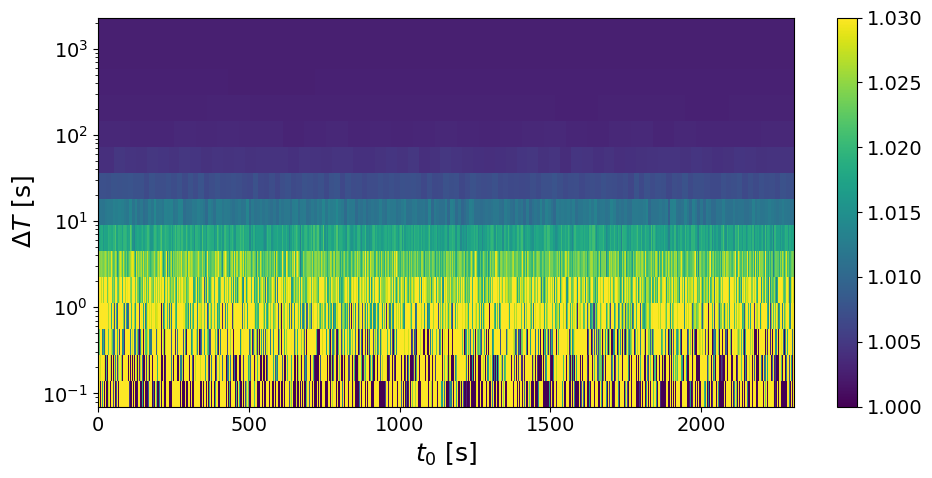

In [ ]:
############################
q = .105
vmin, vmax = 1.0, 1.03
lower_mt = 6
filter_layer = 6
############################

XPCS.plot_G2tmt(G2tmt[q], itime, vmin, vmax, yscale='log', lower_mt=lower_mt, filter_layer=filter_layer)

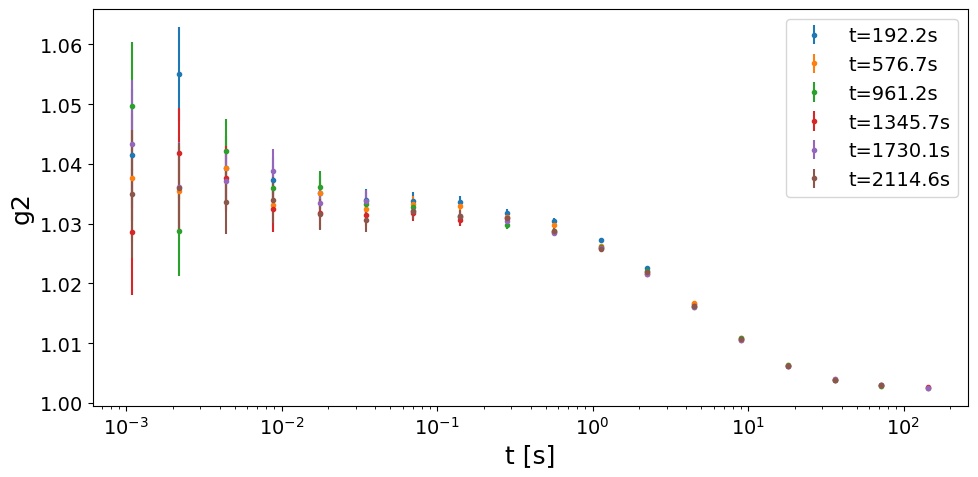

In [ ]:
################
Nbunch = 6
################

NfXbunch = int(G2tmt[q][0].shape[0]/Nbunch)
g2mt_cuts = {}
for n in range(Nbunch):
    t_bunch = round(itime*NfXbunch*(n+1/2),1)
    G2tmt_cuts = XPCS.cut_G2tmt(itime, G2tmt[q], tmin=itime*NfXbunch*n, tmax=itime*NfXbunch*(n+1))
    g2mt_cuts[t_bunch] = XPCS.get_g2mt(itime, G2tmt_cuts)

### PLOT ###
fig, ax = plt.subplots(figsize=(10, 5))
for n in g2mt_cuts.keys():
    ax.errorbar(g2mt_cuts[n][0], g2mt_cuts[n][1], yerr=g2mt_cuts[n][2], fmt='o', label=f't={n}s', markersize=3)
ax.set_xlabel('t [s]')
ax.set_ylabel('g2')
ax.set_xscale('log')
ax.legend()
fig.tight_layout()
plt.show()

#### Fit

Using Global variables: model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan



,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.065,0.01,8.454087,0.401266,4.746418,0.642616,0.027445,4.270785,0.033227,0.000859,2.584244,1.009164,0.000180,0.017820,5.144409
1,0.085,0.01,6.329106,0.450722,7.121418,0.609856,0.026064,4.273798,0.034629,0.001234,3.563166,1.003682,0.000068,0.006745,18.027582
2,0.105,0.01,5.742056,0.423013,7.366926,0.616210,0.025405,4.122840,0.034737,0.001284,3.697112,1.002744,0.000049,0.004855,27.547969
3,0.125,0.01,5.380969,0.358298,6.658617,0.617350,0.023302,3.774559,0.034881,0.001173,3.361503,1.002412,0.000041,0.004119,20.727182
4,0.145,0.01,5.137470,0.327614,6.376946,0.620136,0.022779,3.673262,0.034334,0.001114,3.245963,1.002527,0.000040,0.003946,17.708444


Using Global variables: sample_name, Ndataset, Nscan 



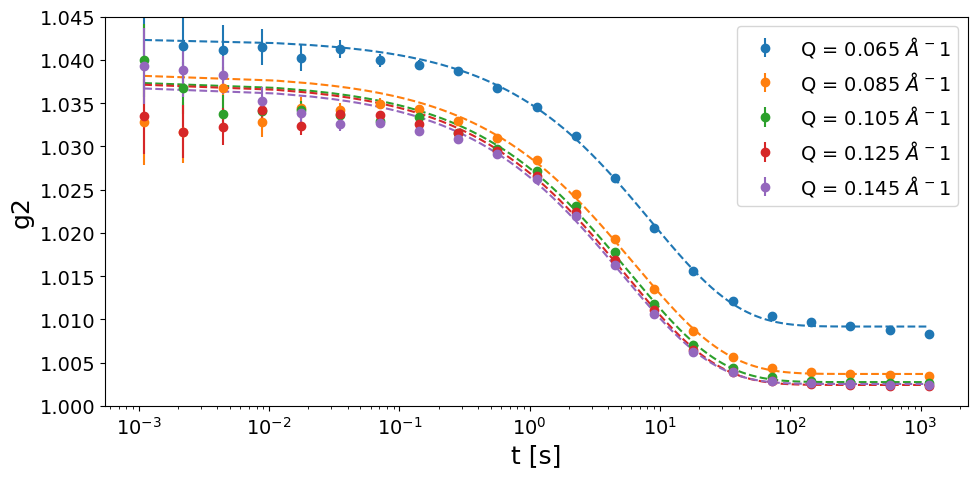

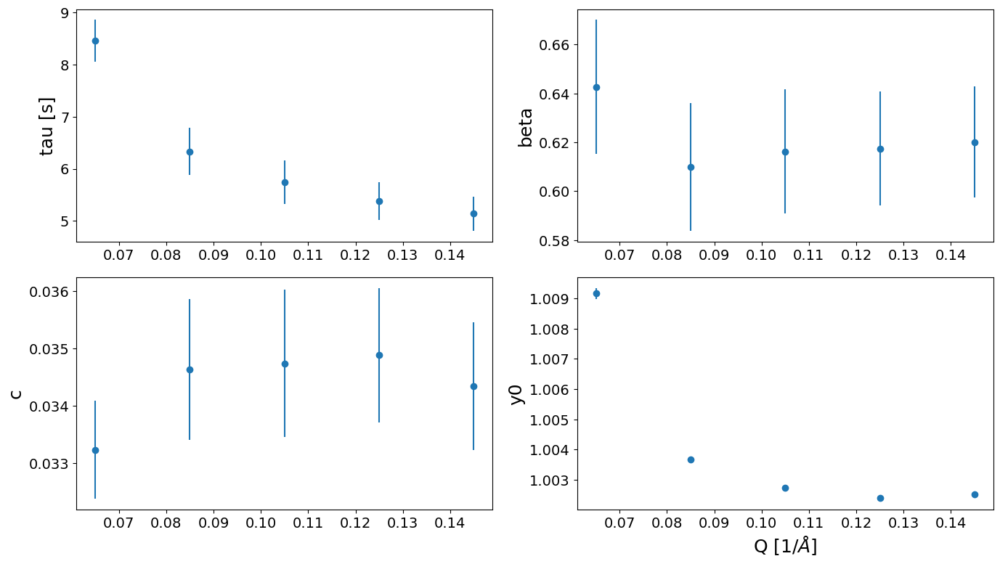

In [ ]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.03)
#params.add('y0', value=1.0023, vary=False)
##############################################

g2fit, fig, ax = plotfit_byQ_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True, mt=True)
ax.set_ylim(1, 1.045)
ax.legend()
fig.tight_layout(); fig.show()

fig, axs = plotfitparams_byQ_4damaged_vGeO2(g2fit)
fig.tight_layout(); fig.show()

## XPCS scan: delcoup=3.00, T=30 60min @ 1ms (3600000fm) (GeO2_6q_delcoup3, dataset 1, scan 2)

In [ ]:
#######################################
sample_name = 'GeO2_6q_delcoup_3'
Ndataset = 1
Nscan = 2
Nfi, Nff = None, None
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 3599664
Ei = 9.699998837562536
itime = 0.0011
theta = 3.0000000000000004
Q = 0.26
T = 65.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Qmask

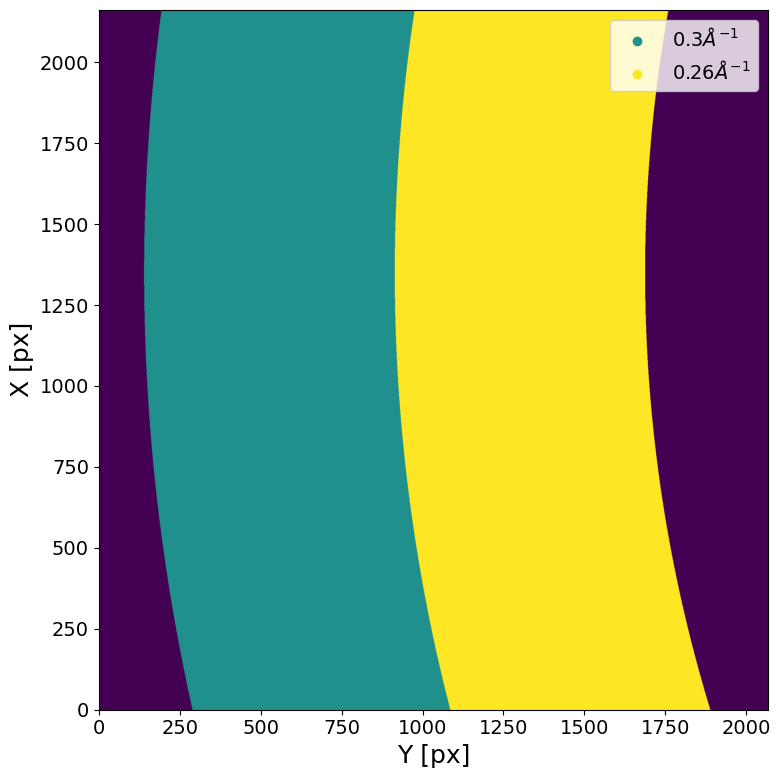

In [ ]:
###################
Qs_section = [.3,.26]
dQ_section = .02
###################

Qmask = XPCS.gen_Qmask(Ei, theta, Qs_section, dQ_section, Qmap_plot=False)

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  63479 pixels (of 4471016 => 1.42 %)
# of pixels below Ith_low treshold ->  377852 pixels (of 4471016 => 8.45 %)
################################################################################



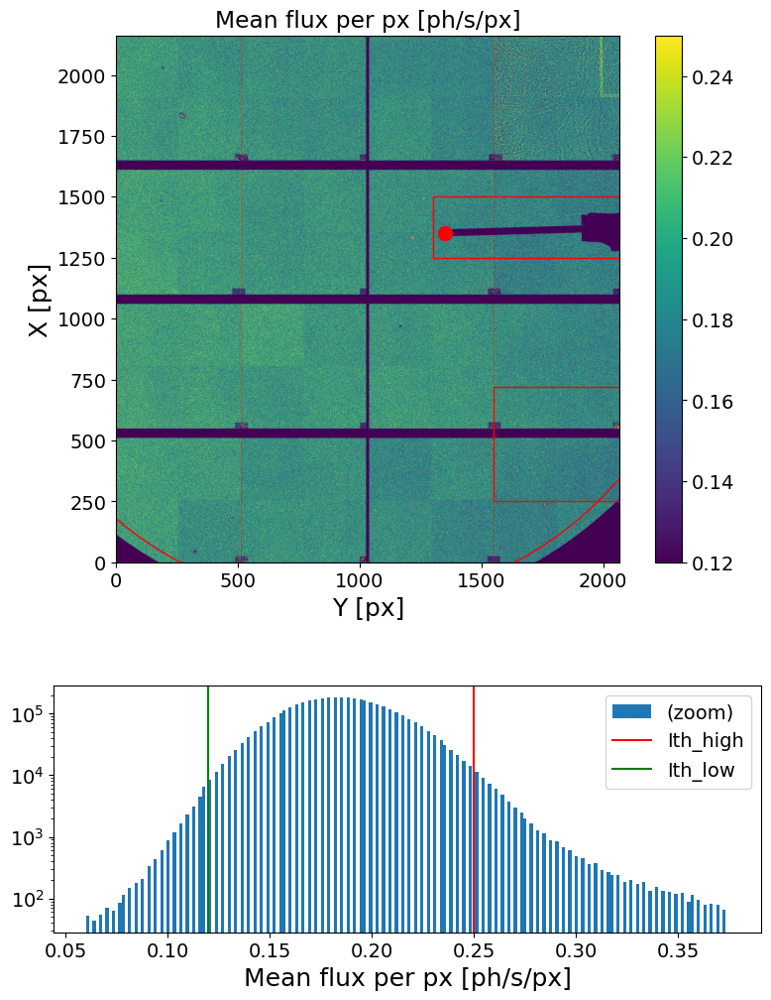

#################################################
Masked area =  88.38167879515528 %
#################################################



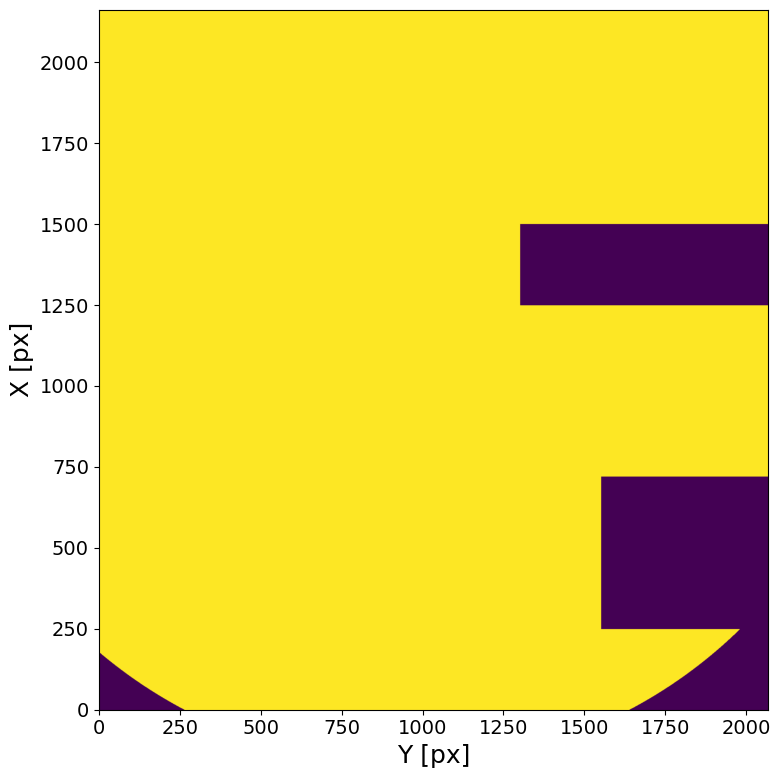

In [ ]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Rectangle', 'x0':250, 'y0':1550, 'xl':470, 'yl':2000, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_low = .12, Ith_high=.25, Nff=300000, mask_geom=geom,)
bs_mask = XPCS.gen_mask(mask_geom=geom)

### Intensity analysis

In [ ]:
####################
Lbin = 100
Nstep = 1000
Nfi = 15
Nff=None
####################

It = {}
for q in Qmask.keys():
    mask= e4m_mask * e4m_htmask * bs_mask * Qmask[q]
    It[q] = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nstep=Nstep))
    np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", It[q])

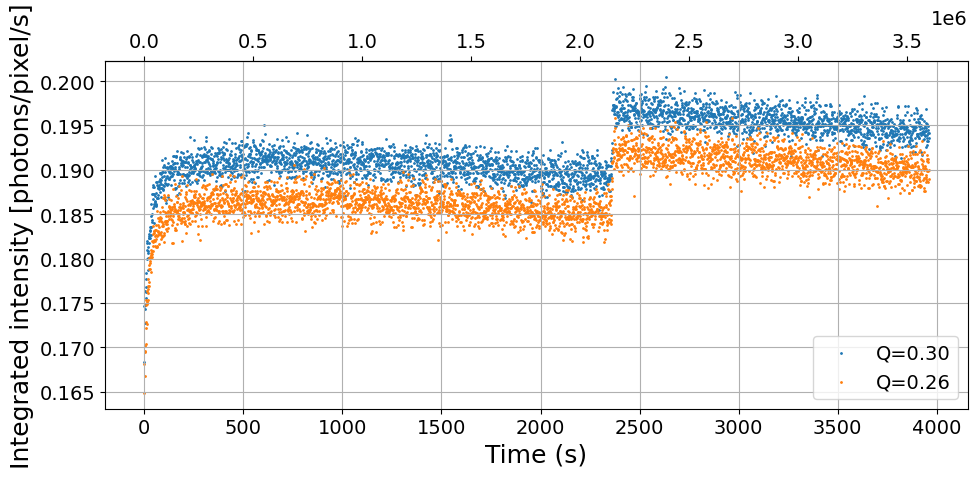

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
for q in Qmask.keys():
    ax.scatter(It[q][0], It[q][1], label='Q={:.2f}'.format(q), s=1)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Integrated intensity [photons/pixel/s]')
ax.secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
ax.grid()
#ax.set_xlim(0, 100)
ax.legend()
fig.tight_layout()
plt.show()

### Linear Correlation by Dose

In [ ]:
###################
Nfi = 20
Nff = int(0.1e6)
Lbin = 10
###################
if Lbin is None: Lbin=1

G2t = {}
for q in tqdm(Qs_section, desc='Calculating G2'):
    with redirect_stdout(io.StringIO()):
        mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
        G2t[q] = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin)

Calculating G2: 100%|██████████| 2/2 [00:12<00:00,  6.02s/it]


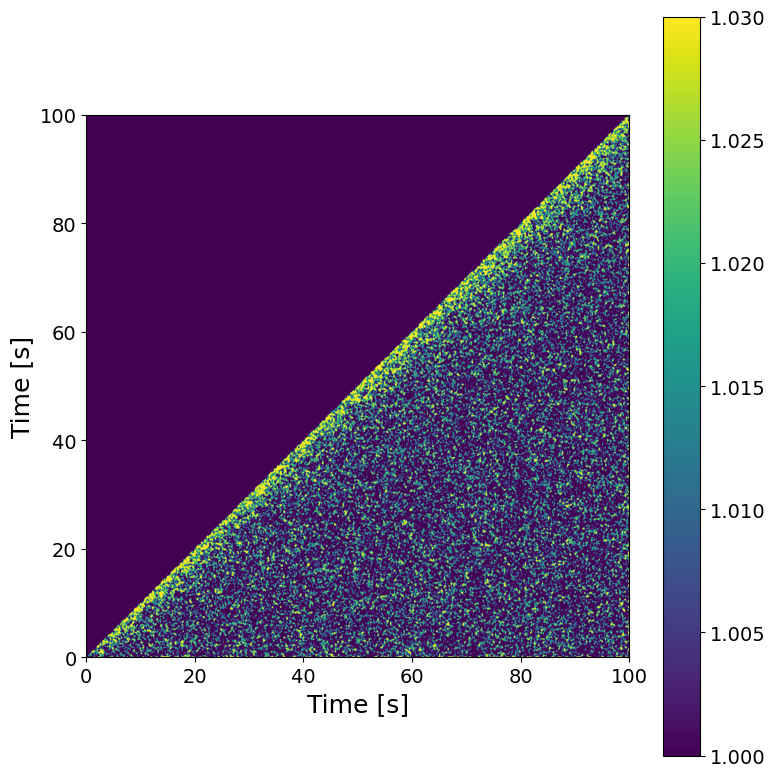

In [ ]:
############################
q = .3
t1, t2 = None, 100
vmin, vmax = 1.0, 1.03
############################
XPCS.plot_G2t(G2t[q], vmin, vmax, itime=itime*Lbin, t1=t1, t2=t2, sigma_filter=10)

In [ ]:
################
Nbunch = 5
################

NfXbunch = int(G2t[q].shape[0]/Nbunch)
g2 = {}
for q in tqdm(Qs_section):
    g2[q] = {}
    for n in range(Nbunch):
        t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
        with redirect_stdout(io.StringIO()):
            g2[q][t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[q][NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

100%|██████████| 2/2 [00:00<00:00, 18.40it/s]


Using Global variables: Nbunch, model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan 

###### Q = 0.3 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
11.0,0.3,0.02,2.125089,0.300434,14.137484,0.784439,0.124353,15.852411,0.035906,0.003730,10.387429,1.002040,0.000834,0.083217,1.027642
33.0,0.3,0.02,3.171803,0.289465,9.126189,1.089776,0.157400,14.443366,0.028567,0.002241,7.845438,1.002698,0.000681,0.067881,1.054862
55.0,0.3,0.02,3.459039,0.363774,10.516629,0.940618,0.146090,15.531230,0.029081,0.002651,9.115600,1.003588,0.000944,0.094044,1.004721
77.0,0.3,0.02,5.105389,0.557420,10.918264,0.987475,0.158558,16.056949,0.028780,0.002823,9.809342,1.001069,0.001514,0.151192,0.998652
99.0,0.3,0.02,4.519640,0.700415,15.497144,0.811443,0.164099,20.223096,0.028899,0.003865,13.373473,1.002150,0.001971,0.196710,1.036386


###### Q = 0.26 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
11.0,0.26,0.02,3.860420,0.598052,15.491879,0.888783,0.197453,22.216073,0.032256,0.004356,13.504887,1.000000,0.001746,0.174588,1.626800
33.0,0.26,0.02,3.699423,0.475415,12.851052,0.851458,0.154616,18.158924,0.032445,0.003652,11.256101,1.001657,0.001487,0.148499,1.018147
55.0,0.26,0.02,4.087385,0.471998,11.547672,0.934115,0.161452,17.283992,0.030249,0.003126,10.335149,1.003260,0.001354,0.134959,0.989254
77.0,0.26,0.02,4.128546,0.374609,9.073627,1.172153,0.185676,15.840605,0.026113,0.002176,8.334169,1.004411,0.000869,0.086565,0.974011
99.0,0.26,0.02,5.172505,0.870312,16.825732,0.867548,0.185773,21.413567,0.029426,0.004192,14.247162,1.001887,0.002376,0.237173,1.044895


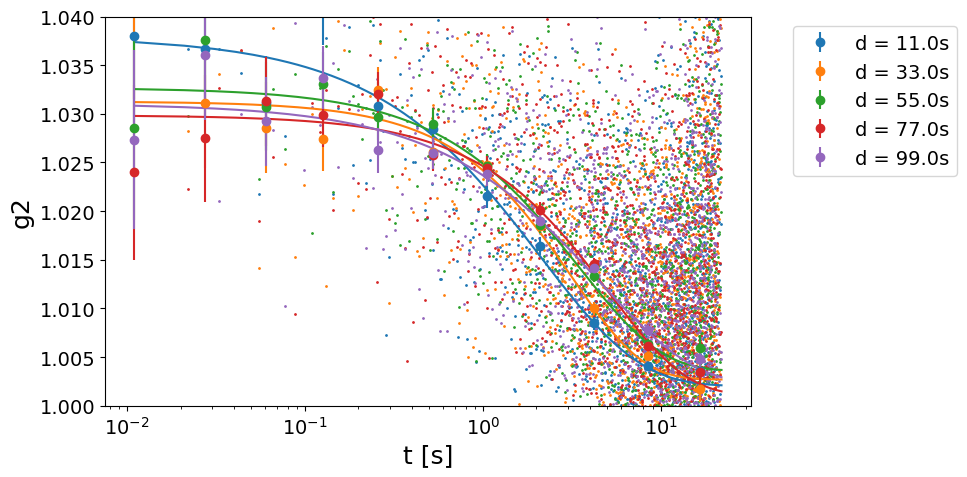

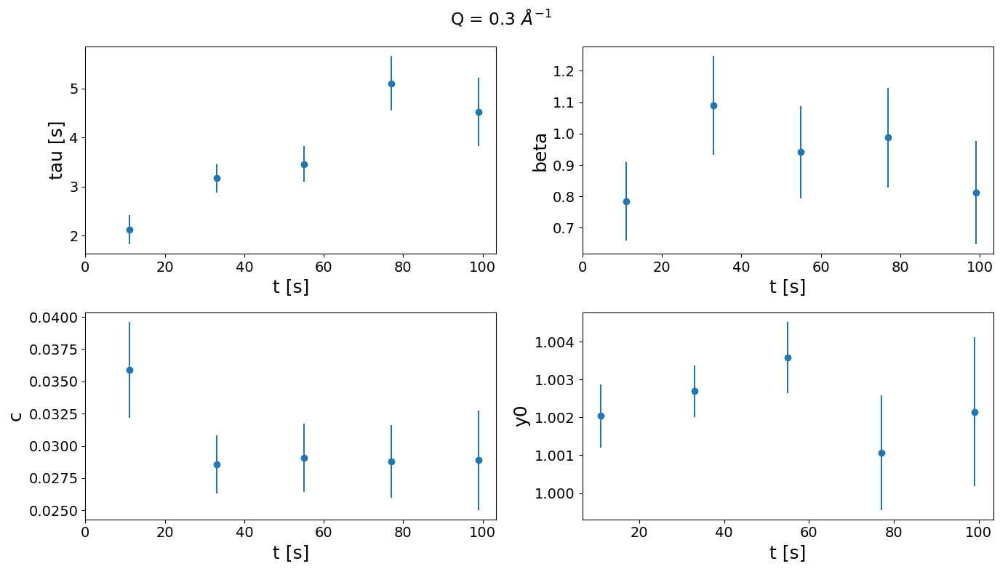

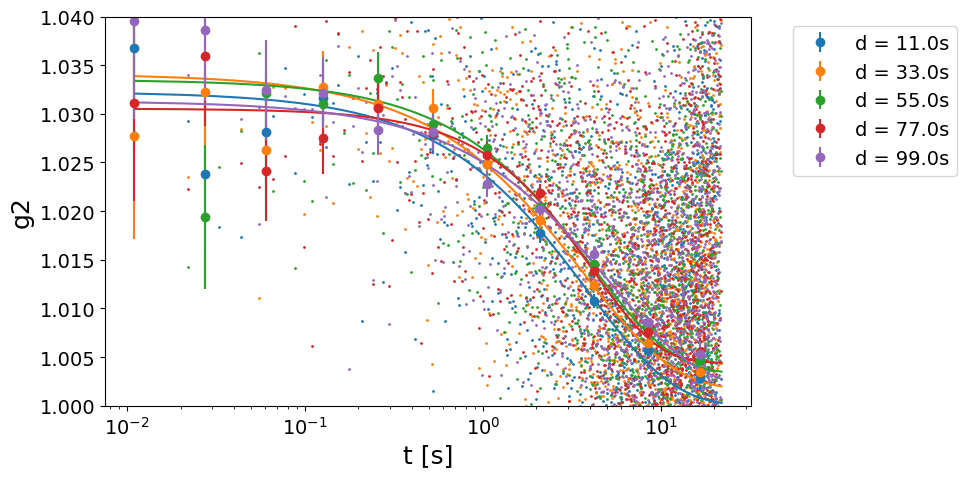

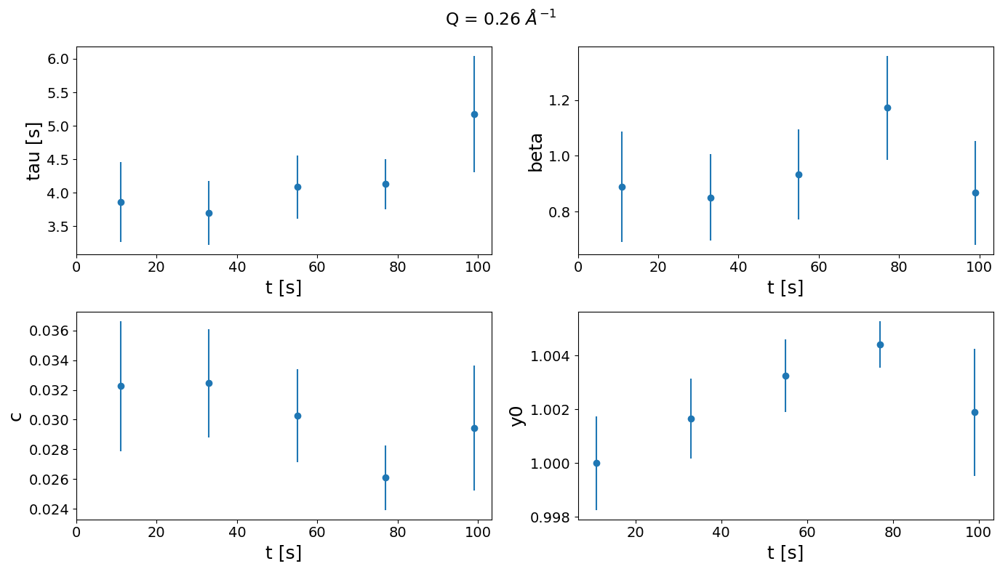

In [ ]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.0023, vary=False)
##############################################

plotfit_byQ_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Multitau correlation of damaged-vGeO2

In [ ]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 3599664    =>    log2(Nf) = 21.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**21                 20             41.7        1502512
1    3*2**20                 19             13.0         453936
2   13*2**18                 17              5.0         191792
3   27*2**17                 16              2.0          60720
4  109*2**15                 14              1.0          27952
5  219*2**14                 13              0.0          11568
6  439*2**13                 12              0.0           3376
----------------------------------------------------


In [ ]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = Nfi +  3*2**20
sparse_depth = 12
dense_depth = 19
##################

G2tmt, g2mt = {}, {}
for q in tqdm(Qmask.keys(), desc=f'Calculating G2tmt @ q={q}'):
    mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
    G2tmt[q] = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)
    g2mt[q] = np.vstack(XPCS.get_g2mt(itime, G2tmt[q]))
    np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", g2mt[q])

Calculating G2tmt @ q=0.3:   0%|          | 0/2 [00:00<?, ?it/s]

Loading frames ...
Done! (elapsed time = 29.11 s)
Masking data ...
Done! (elapsed time = 76.79 s)
	 | 3145728 frames X 1437365 pixels
	 | sparsity = 2.12e-04
	 | memory usage (sparse.csr_array @ float32) = 10.726 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [06:13<00:00,  2.06it/s]


Done! (elapsed time = 373.28 s)
Computing dense multitau G2t...


Calculating G2tmt @ q=0.3:  50%|█████     | 1/2 [08:02<08:02, 482.69s/it]

Done! (elapsed time = 3.46 s)
Loading frames ...
Done! (elapsed time = 27.97 s)
Masking data ...
Done! (elapsed time = 73.36 s)
	 | 3145728 frames X 1192632 pixels
	 | sparsity = 2.07e-04
	 | memory usage (sparse.csr_array @ float32) = 8.693 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [05:36<00:00,  2.28it/s]


Done! (elapsed time = 336.73 s)
Computing dense multitau G2t...


Calculating G2tmt @ q=0.3: 100%|██████████| 2/2 [15:23<00:00, 461.85s/it]

Done! (elapsed time = 2.86 s)


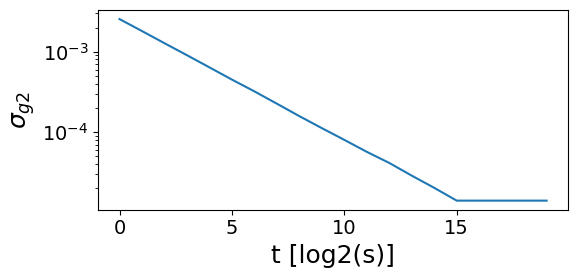

In [ ]:
# Cure the std divergence
for q in g2mt.keys():
    g2mt[q][2][-1] = g2mt[q][2][-5]
    g2mt[q][2][-2] = g2mt[q][2][-5]
    g2mt[q][2][-3] = g2mt[q][2][-5]
    g2mt[q][2][-4] = g2mt[q][2][-5]

# plot
plt.figure(figsize=(6, 3))
plt.plot(g2mt[q][2])
plt.yscale('log')
plt.xlabel('t [log2(s)]')
plt.ylabel('$\\sigma_{g2}$')
plt.tight_layout(); plt.show()

#### Check of the dose-independence

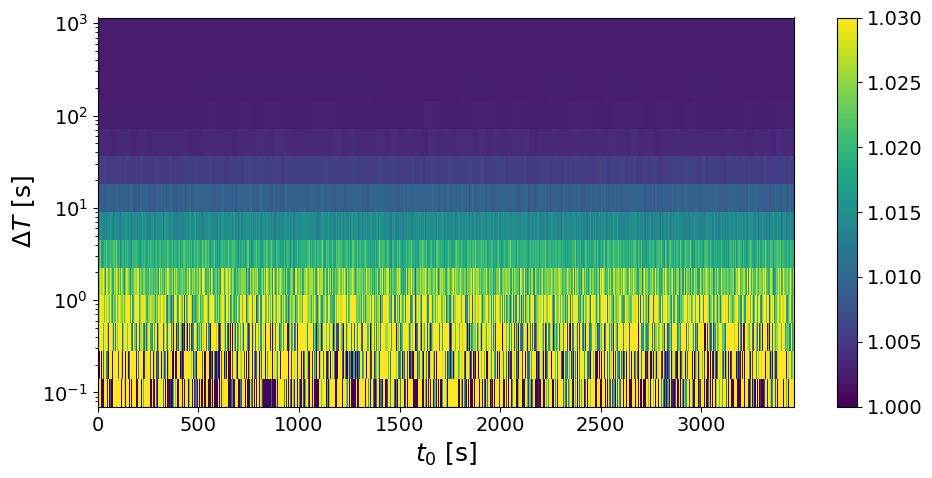

In [ ]:
############################
q = .3
vmin, vmax = 1.0, 1.03
lower_mt = 6
filter_layer = 6
############################

XPCS.plot_G2tmt(G2tmt[q], itime, vmin, vmax, yscale='log', lower_mt=lower_mt, filter_layer=filter_layer)

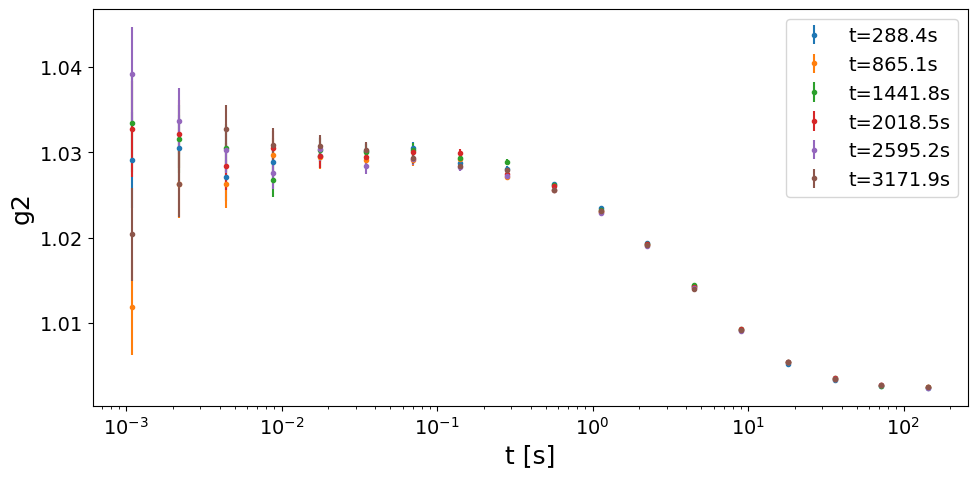

In [ ]:
################
Nbunch = 6
################

NfXbunch = int(G2tmt[q][0].shape[0]/Nbunch)
g2mt_cuts = {}
for n in range(Nbunch):
    t_bunch = round(itime*NfXbunch*(n+1/2),1)
    G2tmt_cuts = XPCS.cut_G2tmt(itime, G2tmt[q], tmin=itime*NfXbunch*n, tmax=itime*NfXbunch*(n+1))
    g2mt_cuts[t_bunch] = XPCS.get_g2mt(itime, G2tmt_cuts)

### PLOT ###
fig, ax = plt.subplots(figsize=(10, 5))
for n in g2mt_cuts.keys():
    ax.errorbar(g2mt_cuts[n][0], g2mt_cuts[n][1], yerr=g2mt_cuts[n][2], fmt='o', label=f't={n}s', markersize=3)
ax.set_xlabel('t [s]')
ax.set_ylabel('g2')
ax.set_xscale('log')
ax.legend()
fig.tight_layout()
plt.show()

#### Fit

Using Global variables: model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan



,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.30,0.02,4.920013,0.230133,4.677493,0.637984,0.018082,2.834230,0.030096,0.000734,2.438544,1.002459,0.000038,0.003820,27.518405
1,0.26,0.02,5.075740,0.255774,5.039137,0.633117,0.018755,2.962378,0.031242,0.000815,2.608134,1.002921,0.000039,0.003937,28.348792


Using Global variables: sample_name, Ndataset, Nscan 



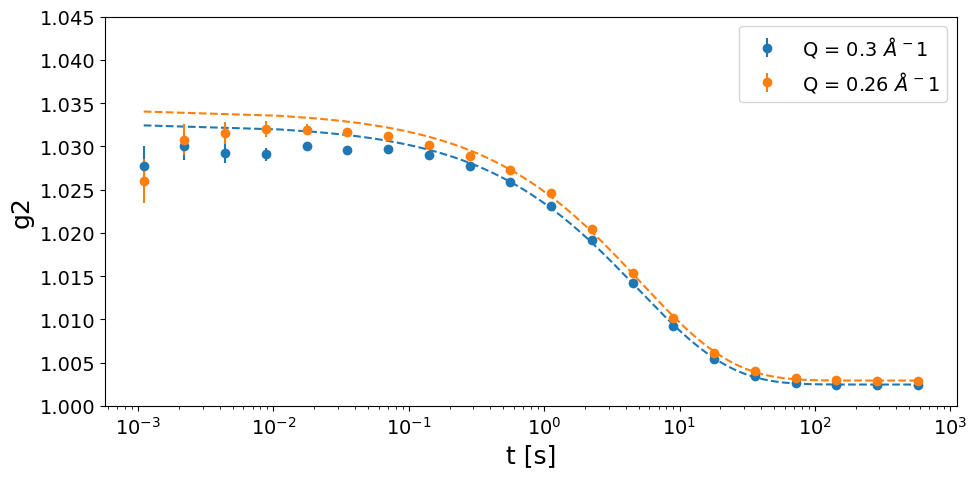

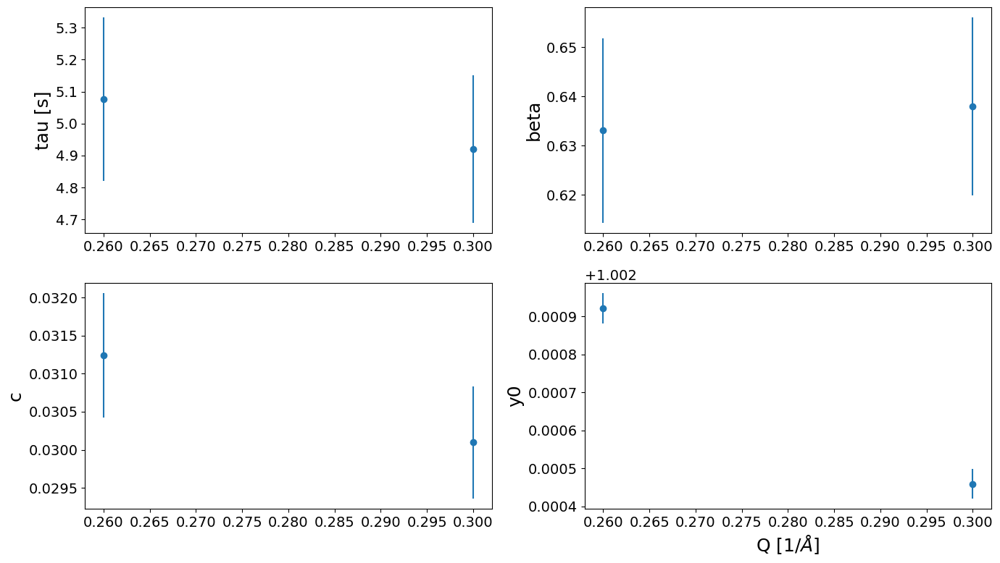

In [ ]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.03)
#params.add('y0', value=1.0023, vary=False)
##############################################

g2fit, fig, ax = plotfit_byQ_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True, mt=True)
ax.set_ylim(1, 1.045)
ax.legend()
fig.tight_layout(); fig.show()

fig, axs = plotfitparams_byQ_4damaged_vGeO2(g2fit)
fig.tight_layout(); fig.show()

##   XPCS scan delcoup=5, T=30, 60min @ 1ms (3600000fm) (GeO2_6q_delcoup5, dataset 1, scan 2)

In [ ]:
#######################################
sample_name = 'GeO2_6q_delcoup_5'
Ndataset = 1
Nscan = 2
Nfi, Nff = None, None
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=60)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 3599664
Ei = 9.699998837562536
itime = 0.0011
theta = 5.0
Q = 0.43
T = 65.99 min
#############################

Loading sparse array ...


	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00057.h5 (58/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00024.h5 (25/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/720 loops)
	 -> loading file	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/720 loops)
 eiger4m_v2_sparse_frame_0_00011.h5 (12/720 loops)
	 -> loading file	 -> loading file eiger4m_v2_sparse_fra

### Qmask

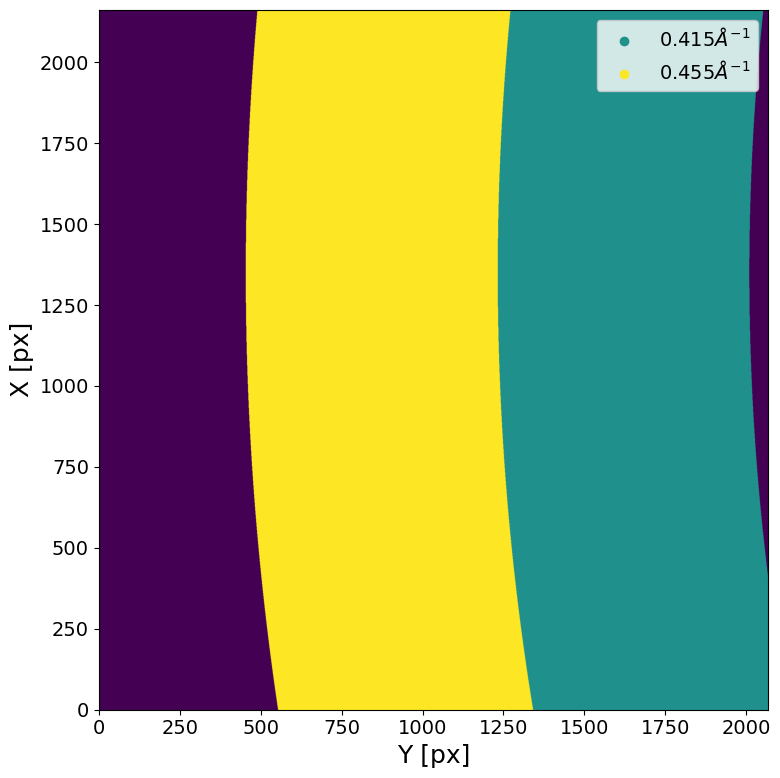

In [ ]:
###################
Qs_section = [.415,.455]
dQ_section = .02
###################

Qmask = XPCS.gen_Qmask(Ei, theta, Qs_section, dQ_section, Qmap_plot=False)

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  379924 pixels (of 4471016 => 8.5 %)
# of pixels below Ith_low treshold ->  1805608 pixels (of 4471016 => 40.38 %)
################################################################################



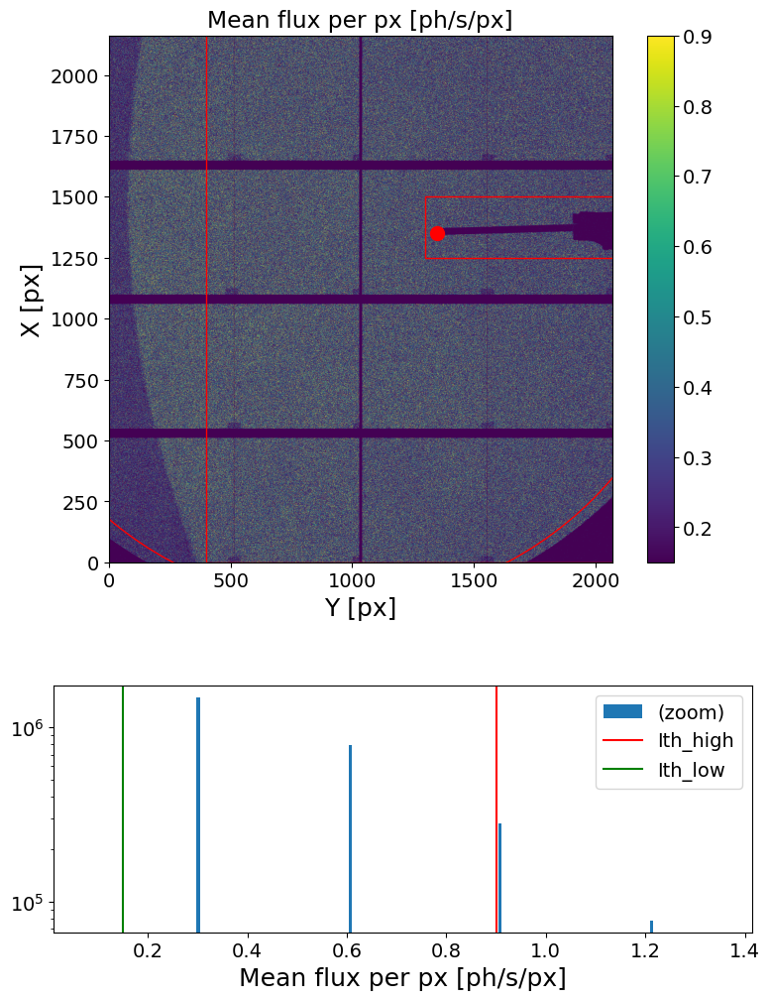

#################################################
Masked area =  74.81720038577362 %
#################################################



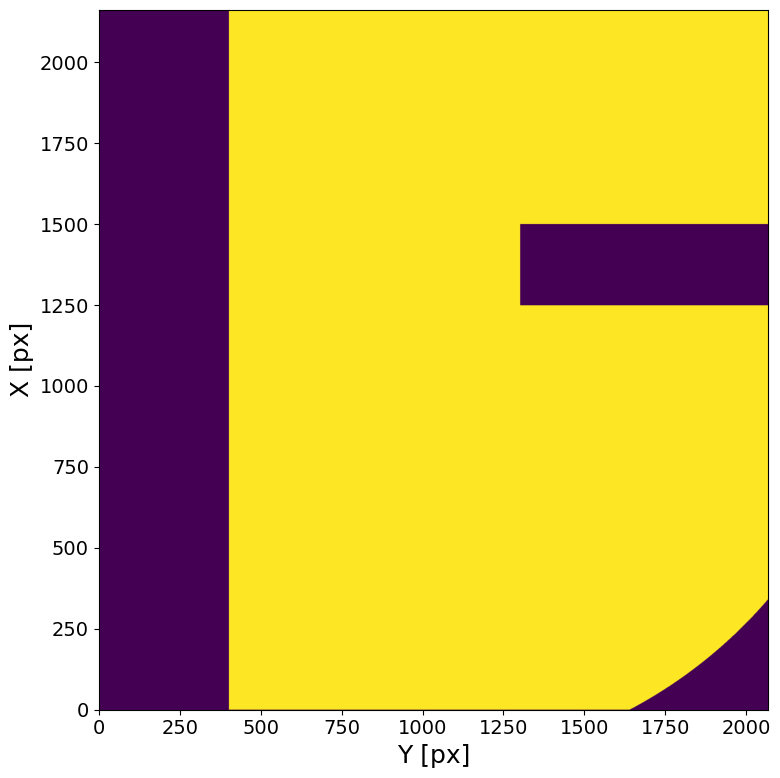

In [ ]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Rectangle', 'x0':0, 'y0':400, 'xl':3000, 'yl':3000, 'inside':True},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_low = .15, Ith_high=.9, Nff=3000, mask_geom=geom,)
bs_mask = XPCS.gen_mask(mask_geom=geom)

### Intensity analysis

In [ ]:
####################
Lbin = 100
Nstep = 1000
Nfi = 15
Nff=None
####################

It = {}
for q in Qmask.keys():
    mask= e4m_mask * e4m_htmask * bs_mask * Qmask[q]
    It[q] = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nstep=Nstep))
    np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", It[q])

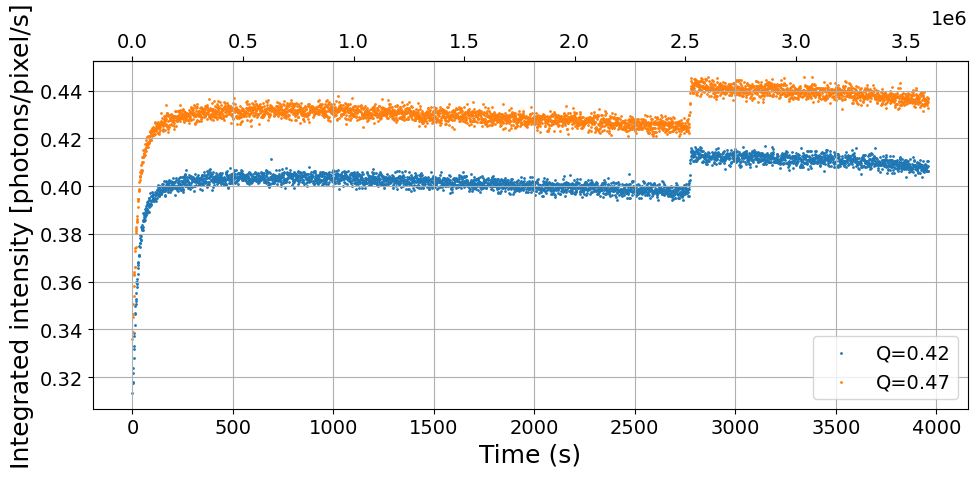

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
for q in Qmask.keys():
    ax.scatter(It[q][0], It[q][1], label='Q={:.2f}'.format(q), s=1)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Integrated intensity [photons/pixel/s]')
ax.secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
ax.grid()
#ax.set_xlim(0, 100)
ax.legend()
fig.tight_layout()
plt.show()

### Linear Correlation by Dose

In [ ]:
###################
Nfi = 20
Nff = int(0.1e6)
Lbin = 100
###################
if Lbin is None: Lbin=1

G2t = {}
for q in tqdm(Qs_section, desc='Calculating G2'):
    with redirect_stdout(io.StringIO()):
        mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
        G2t[q] = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin)

Calculating G2: 100%|██████████| 2/2 [00:25<00:00, 12.68s/it]


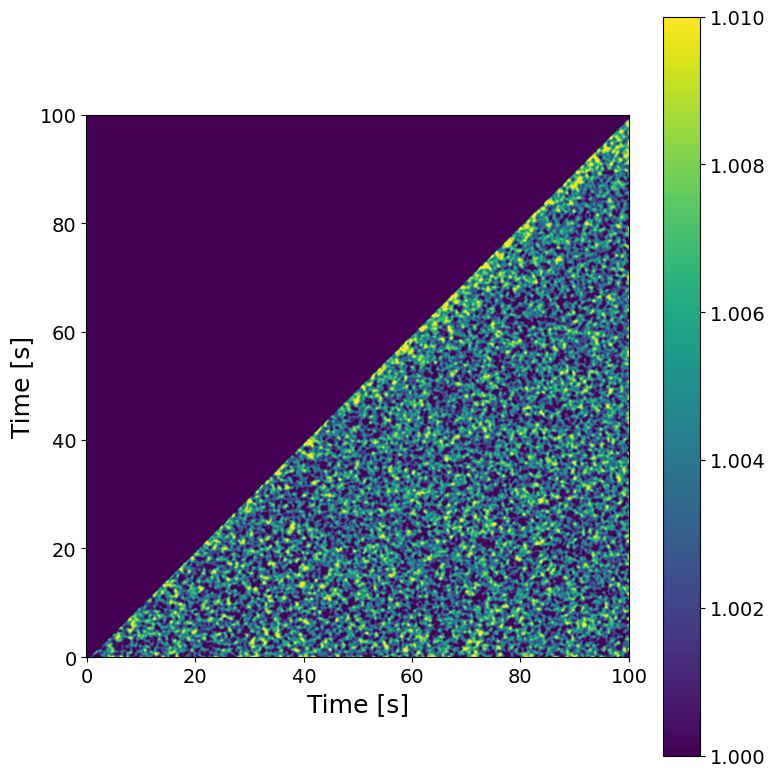

In [ ]:
############################
q = q
t1, t2 = None, 100
vmin, vmax = 1.0, 1.01
############################
XPCS.plot_G2t(G2t[q], vmin, vmax, itime=itime*Lbin, t1=t1, t2=t2, sigma_filter=2)

In [ ]:
################
Nbunch = 3
################

NfXbunch = int(G2t[q].shape[0]/Nbunch)
g2 = {}
for q in tqdm(Qs_section):
    g2[q] = {}
    for n in range(Nbunch):
        t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
        with redirect_stdout(io.StringIO()):
            g2[q][t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[q][NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

100%|██████████| 2/2 [00:00<00:00, 215.17it/s]


Using Global variables: Nbunch, model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan 

###### Q = 0.415 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
18.3,0.415,0.02,2.191127,0.450514,20.560817,2.000000,1.151235,57.561754,0.003296,0.000721,21.879923,1.004490,0.000123,0.012234,1.030966
54.9,0.415,0.02,2.707180,0.669132,24.716953,0.867492,0.232381,26.787672,0.007001,0.001242,17.740687,1.004178,0.000182,0.018137,1.077357
91.6,0.415,0.02,4.133631,0.458613,11.094669,1.333796,0.270124,20.252246,0.006598,0.000656,9.941861,1.004188,0.000149,0.014857,1.061702


###### Q = 0.455 ######


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
18.3,0.455,0.02,1.890076,0.304516,16.111336,1.796574,0.708353,39.427992,0.004243,0.000702,16.537140,1.003341,0.000100,0.009996,1.064615
54.9,0.455,0.02,2.502317,0.431006,17.224262,1.306940,0.384850,29.446642,0.005513,0.000824,14.952379,1.003627,0.000124,0.012402,1.552565
91.6,0.455,0.02,3.094238,0.475639,15.371759,1.057645,0.219742,20.776503,0.006527,0.000799,12.247961,1.003345,0.000128,0.012770,1.148305


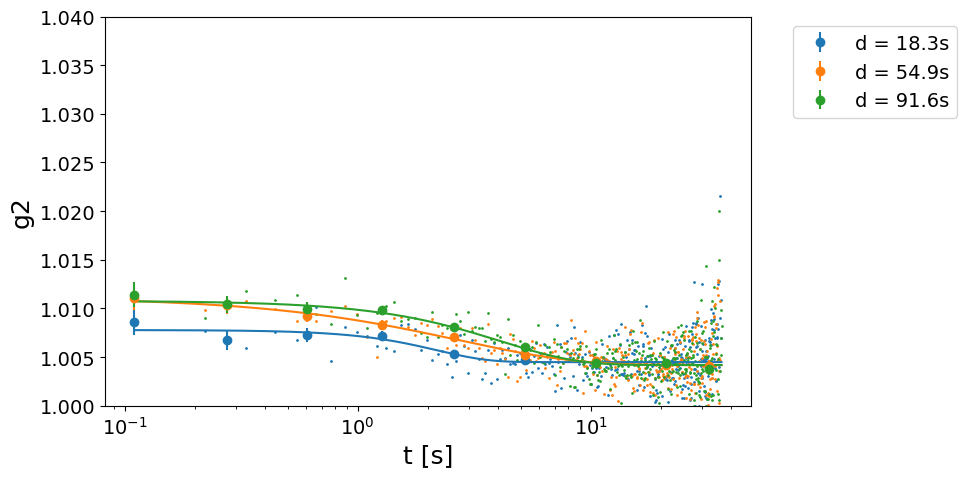

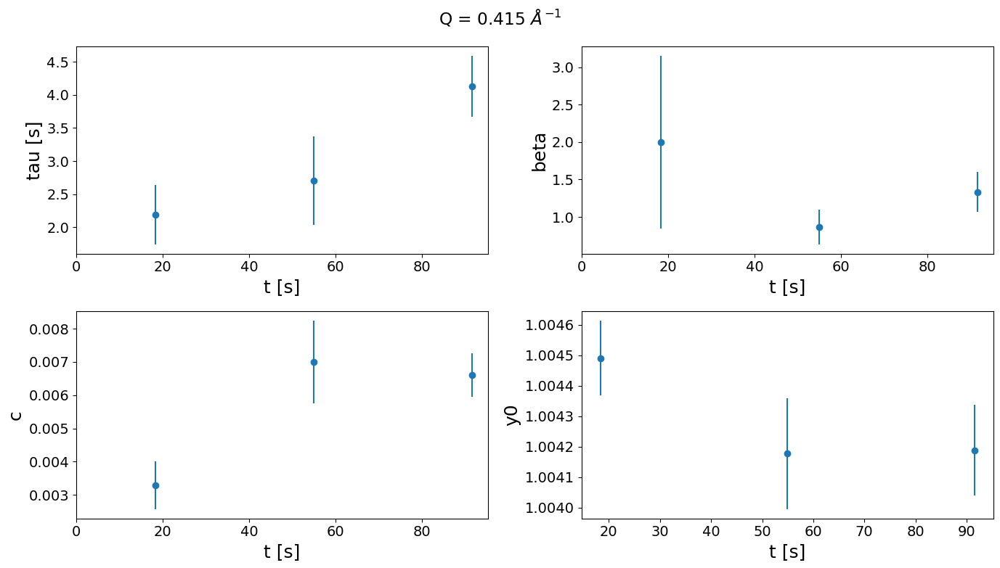

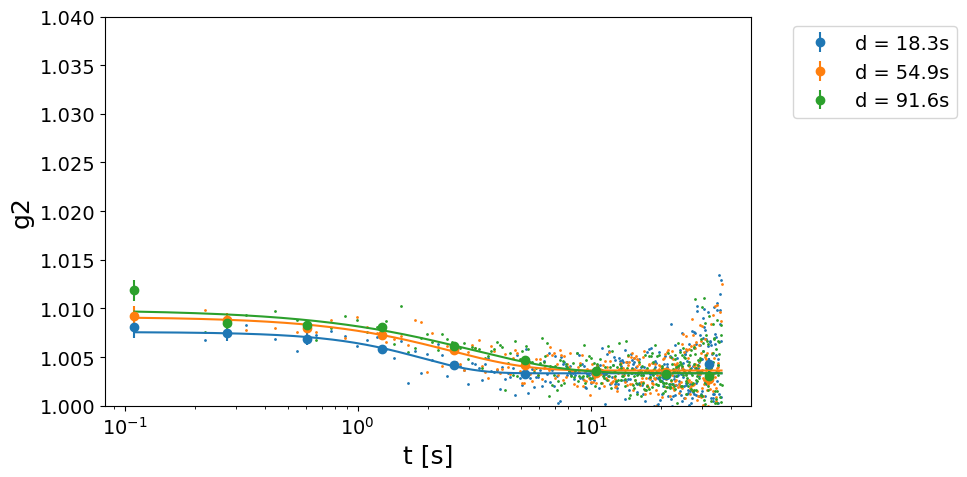

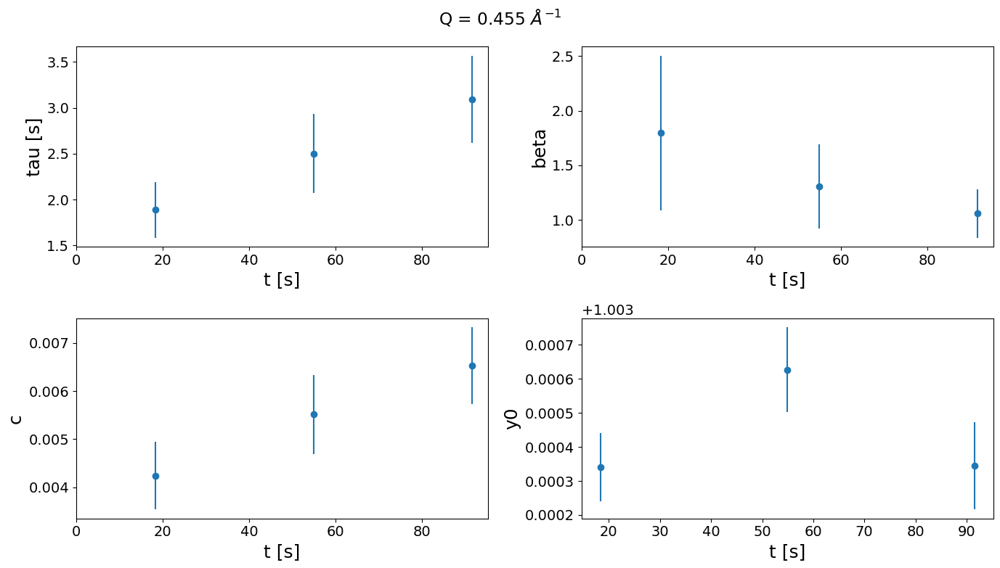

In [ ]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.0023, vary=False)
##############################################

plotfit_byQ_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Multitau correlation of damaged-vGeO2

In [ ]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 3599664    =>    log2(Nf) = 21.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**21                 20             41.7        1502512
1    3*2**20                 19             13.0         453936
2   13*2**18                 17              5.0         191792
3   27*2**17                 16              2.0          60720
4  109*2**15                 14              1.0          27952
5  219*2**14                 13              0.0          11568
6  439*2**13                 12              0.0           3376
----------------------------------------------------


In [ ]:
##### INPUTS #####
Nfi = int(.4e6)
Nff = Nfi +  3*2**20
sparse_depth = 12
dense_depth = 19
##################

G2tmt, g2mt = {}, {}
for q in tqdm(Qmask.keys(), desc=f'Calculating G2tmt @ q={q}'):
    mask = e4m_mask * e4m_htmask * bs_mask * Qmask[q]
    G2tmt[q] = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)
    g2mt[q] = np.vstack(XPCS.get_g2mt(itime, G2tmt[q]))
    np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={q}-dQ={dQ_section}.txt", g2mt[q])

Calculating G2tmt @ q=0.455:   0%|          | 0/2 [00:00<?, ?it/s]

Loading frames ...
Done! (elapsed time = 62.15 s)
Masking data ...
Done! (elapsed time = 122.7 s)
	 | 3145728 frames X 1098166 pixels
	 | sparsity = 4.39e-04
	 | memory usage (sparse.csr_array @ float32) = 16.985 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [05:55<00:00,  2.16it/s]


Done! (elapsed time = 355.53 s)
Computing dense multitau G2t...


Calculating G2tmt @ q=0.455:  50%|█████     | 1/2 [09:03<09:03, 543.12s/it]

Done! (elapsed time = 2.66 s)
Loading frames ...
Done! (elapsed time = 61.45 s)
Masking data ...
Done! (elapsed time = 145.49 s)
	 | 3145728 frames X 1425899 pixels
	 | sparsity = 4.71e-04
	 | memory usage (sparse.csr_array @ float32) = 23.636 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [08:08<00:00,  1.57it/s]


Done! (elapsed time = 488.96 s)
Computing dense multitau G2t...


Calculating G2tmt @ q=0.455: 100%|██████████| 2/2 [20:42<00:00, 621.21s/it]

Done! (elapsed time = 3.3 s)


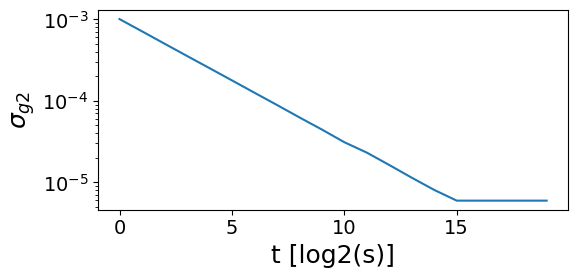

In [ ]:
# Cure the std divergence
for q in g2mt.keys():
    g2mt[q][2][-1] = g2mt[q][2][-5]
    g2mt[q][2][-2] = g2mt[q][2][-5]
    g2mt[q][2][-3] = g2mt[q][2][-5]
    g2mt[q][2][-4] = g2mt[q][2][-5]

# plot
plt.figure(figsize=(6, 3))
plt.plot(g2mt[q][2])
plt.yscale('log')
plt.xlabel('t [log2(s)]')
plt.ylabel('$\\sigma_{g2}$')
plt.tight_layout(); plt.show()

#### Check of the dose-independence

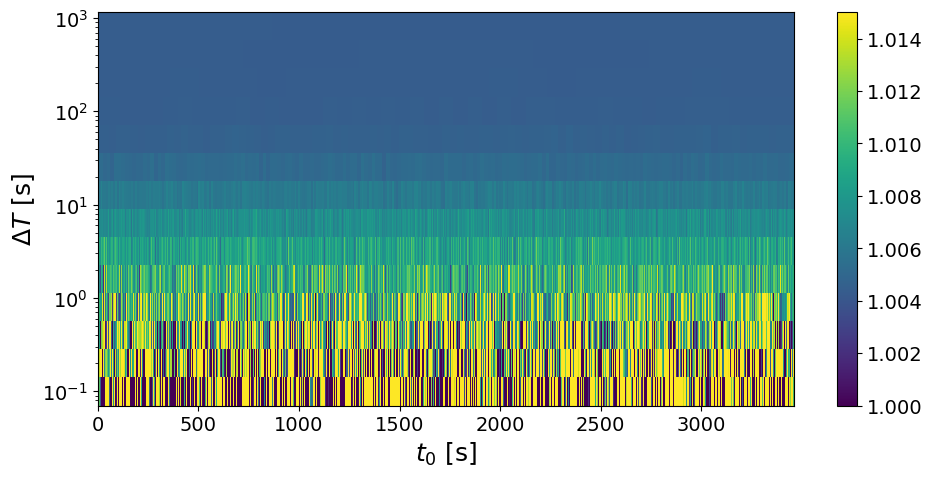

In [ ]:
############################
q = 0.415
vmin, vmax = 1.0, 1.015
lower_mt = 6
filter_layer = 6
############################

XPCS.plot_G2tmt(G2tmt[q], itime, vmin, vmax, yscale='log', lower_mt=lower_mt, filter_layer=filter_layer)

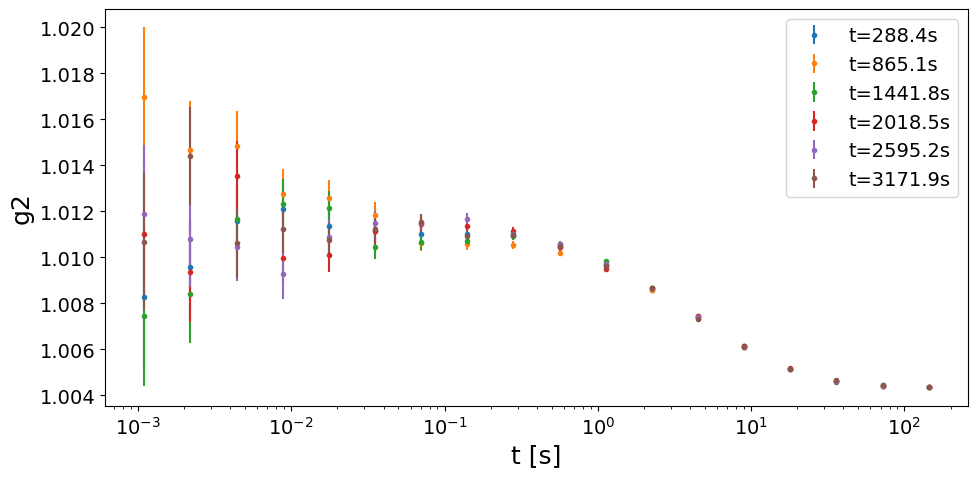

In [ ]:
################
Nbunch = 6
################

NfXbunch = int(G2tmt[q][0].shape[0]/Nbunch)
g2mt_cuts = {}
for n in range(Nbunch):
    t_bunch = round(itime*NfXbunch*(n+1/2),1)
    G2tmt_cuts = XPCS.cut_G2tmt(itime, G2tmt[q], tmin=itime*NfXbunch*n, tmax=itime*NfXbunch*(n+1))
    g2mt_cuts[t_bunch] = XPCS.get_g2mt(itime, G2tmt_cuts)

### PLOT ###
fig, ax = plt.subplots(figsize=(10, 5))
for n in g2mt_cuts.keys():
    ax.errorbar(g2mt_cuts[n][0], g2mt_cuts[n][1], yerr=g2mt_cuts[n][2], fmt='o', label=f't={n}s', markersize=3)
ax.set_xlabel('t [s]')
ax.set_ylabel('g2')
ax.set_xscale('log')
ax.legend()
fig.tight_layout()
plt.show()

#### Fit

Using Global variables: model, params, Qs_section, dQ_section, sample_name, Ndataset, Nscan



,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.415,0.02,4.942776,0.247833,5.014054,0.626226,0.018189,2.904475,0.007778,0.000201,2.583913,1.004358,0.00001,0.000961,7.293498
1,0.455,0.02,4.962249,0.249124,5.020390,0.630601,0.018857,2.990261,0.007198,0.000186,2.585853,1.003268,0.00001,0.000954,9.304579


Using Global variables: sample_name, Ndataset, Nscan 



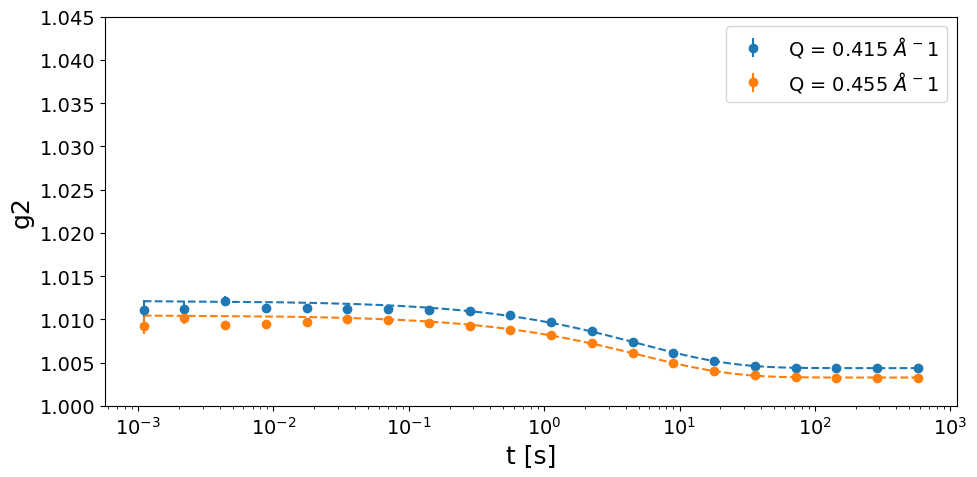

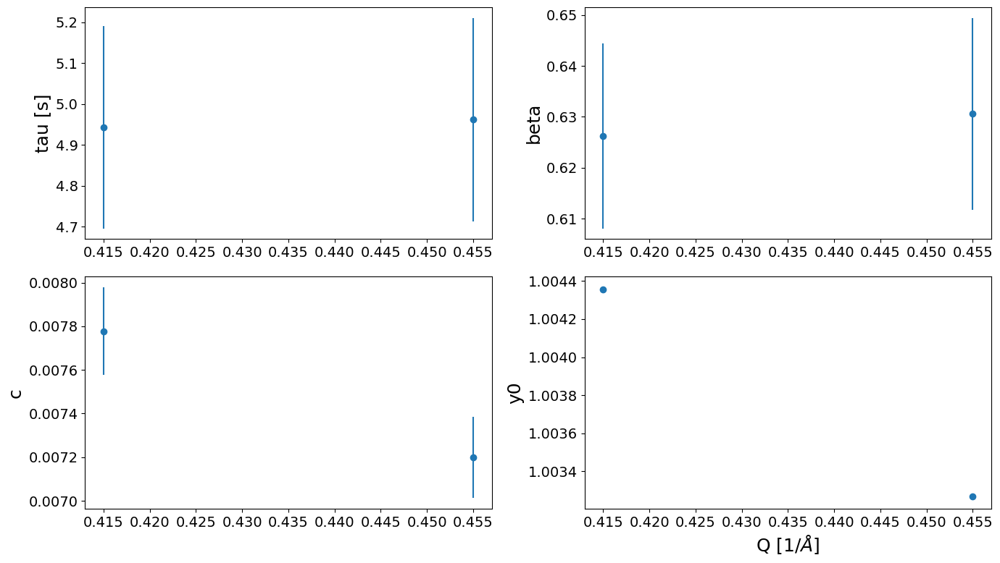

In [ ]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.03)
#params.add('y0', value=1.0023, vary=False)
##############################################

g2fit, fig, ax = plotfit_byQ_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True, mt=True)
ax.set_ylim(1, 1.045)
ax.legend()
fig.tight_layout(); fig.show()

fig, axs = plotfitparams_byQ_4damaged_vGeO2(g2fit)
fig.tight_layout(); fig.show()